# 

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from warnings import filterwarnings
import os
import nltk
import re
import string
import emoji
import ftfy
import unicodedata
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
from sentence_transformers import SentenceTransformer
from wordcloud import WordCloud
from collections import Counter
import spacy
from textblob import TextBlob 
import pickle

from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import recall_score, roc_auc_score, auc, classification_report, confusion_matrix, RocCurveDisplay, ConfusionMatrixDisplay, f1_score
from sklearn.utils import compute_class_weight, compute_sample_weight
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from torch.optim import AdamW, Adam
from torch.nn import BCEWithLogitsLoss, CrossEntropyLoss
from torch.optim.lr_scheduler import ReduceLROnPlateau, CosineAnnealingLR



def set_seed(seed = 42):
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)

SEED = 42
set_seed(SEED)
filterwarnings('ignore')
plt.style.use('ggplot')
nltk.download('punkt')
nltk.download('stopwords')



[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [28]:
DATA_PATH = '../data/data.csv'
df = pd.read_csv(DATA_PATH)

In [29]:
def summary(df):
    print(f"Shape: {df.shape}\n")
    print("Features:")
    for i, col in enumerate(df.columns):
        print(f"{i+1}. {col}")
    
    print("\nSummary:")
    summ = pd.DataFrame({
        'Dtype': df.dtypes,
        'Missing': df.isnull().sum(),
        'Missing (%)': df.isnull().mean() * 100,
        'Unique': df.nunique(),
    })
    display(summ)

    print("\nSample Data:")
    display(df.sample(5, random_state=SEED))
summary(df)


Shape: (17880, 18)

Features:
1. title
2. location
3. department
4. salary_range
5. company_profile
6. description
7. requirements
8. benefits
9. telecommuting
10. has_company_logo
11. has_questions
12. employment_type
13. required_experience
14. required_education
15. industry
16. function
17. fraudulent
18. in_balanced_dataset

Summary:


,Dtype,Missing,Missing (%),Unique
title,object,0,0.000000,11231
location,object,346,1.935123,3105
department,object,11547,64.580537,1337
salary_range,object,15012,83.959732,874
company_profile,object,3308,18.501119,1710
description,object,0,0.000000,15095
requirements,object,2689,15.039150,12119
benefits,object,7196,40.246085,6510
telecommuting,object,0,0.000000,2
has_company_logo,object,0,0.000000,2



Sample Data:


,title,location,department,salary_range,company_profile,description,requirements,benefits,telecommuting,has_company_logo,has_questions,employment_type,required_experience,required_education,industry,function,fraudulent,in_balanced_dataset
4708,Python Engineer,"GB, , London",NaN,NaN,NaN,<p>Stylect is a dynamic startup that helps hel...,<p>We don’t care where you studied or what you...,<p>We are negotiable on salary and there is th...,f,t,f,Full-time,Entry level,Unspecified,Apparel & Fashion,Information Technology,f,f
11079,Entry Level Sales,"US, OH, Cincinnati",NaN,55000-75000,NaN,<p>General Summary: Achieves maximum sales pro...,NaN,<ul>\r\n<li>Great Health and Dental</li>\r\n<l...,t,f,f,Full-time,Entry level,High School or equivalent,Financial Services,Sales,f,f
12357,Agile Project Manager,"US, NY, New York",NaN,NaN,<p>ustwo offers you the opportunity to be your...,"<p>At ustwo™ you get to be yourself, whilst de...",<h3>Skills</h3>\r\n<p>• Experience interfacing...,NaN,f,t,f,NaN,NaN,NaN,NaN,NaN,f,f
14511,Marketing Coordinator,"GB, GBN, London",Business:Marketing,NaN,"<p>We build software for fashion retailers, to...",<h3><b>About EDITD</b></h3>\r\n<p>EDITD runs t...,<h3>Required Skills / Experience:</h3>\r\n<ul>...,NaN,f,t,f,Full-time,NaN,NaN,NaN,Marketing,f,f
16691,Full-stack Web Engineer,"US, CA, San Francisco",NaN,NaN,<p>Runscope is building tools for developers w...,<p>As a Web Engineer at Runscope you'll be res...,<ul>\r\n<li>Extensive front-end web experience...,"<ul>\r\n<li>Be a part of <a href=""#URL_8cd876f...",f,t,t,Full-time,Mid-Senior level,NaN,NaN,Engineering,f,f


In [30]:
print(f"Total duplicate rows: {df.duplicated().sum()}")

Total duplicate rows: 235


In [31]:
df.drop_duplicates(inplace=True)
print(f"Shape after removing duplicates: {df.shape}")

Shape after removing duplicates: (17645, 18)


In [32]:
LABEL = 'fraudulent'

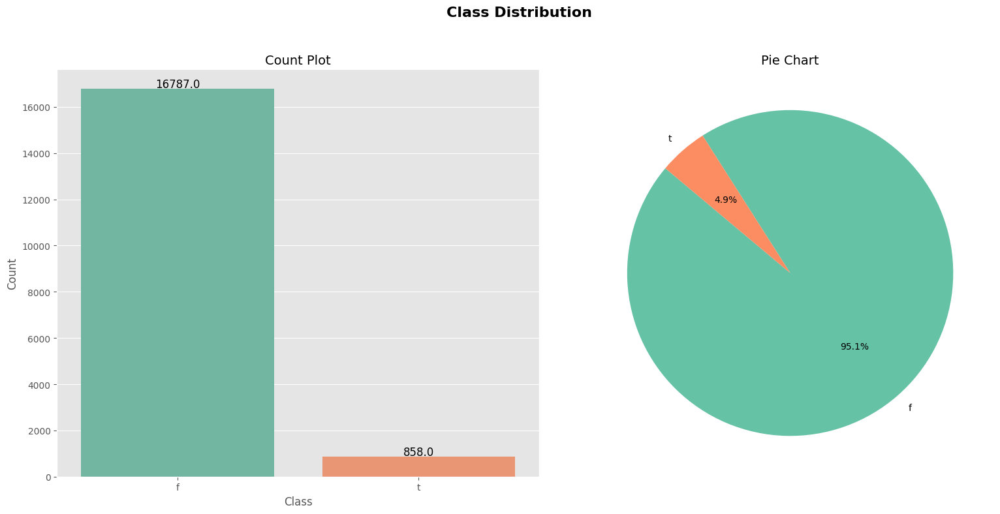

In [14]:
plt.figure(figsize=(16, 8))
plt.suptitle('Class Distribution', fontsize=16, fontweight='bold')
plt.subplot(1, 2, 1)
ax = sns.countplot(data=df, x=LABEL, palette='Set2', order=df[LABEL].value_counts().index)
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height}', (p.get_x() + p.get_width() / 2., height), 
                ha='center', va='center', fontsize=12, color='black', xytext=(0, 5), 
                textcoords='offset points')
plt.title('Count Plot', fontsize=14)
plt.xlabel('Class')
plt.ylabel('Count')
plt.subplot(1, 2, 2)
ax = plt.pie(df[LABEL].value_counts(), labels=df[LABEL].value_counts().index, 
             autopct='%1.1f%%', colors=sns.color_palette('Set2'), startangle=140)
plt.title('Pie Chart', fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [33]:
text_col = ['company_profile', 'description', 'requirements', 'benefits']

# show 5 samples of each text column
for col in text_col:
    print(f"\nSamples from column: {col}")
    samples = df.dropna(subset=[col, LABEL]).sample(5, random_state=SEED)
    texts = samples[col].values
    labels = samples[LABEL].values
    for i, (text, label) in enumerate(zip(texts, labels)):
        print(f"Sample {i+1}:\nLabel: {label}\n{text}\n")
    print("-" * 50)


Samples from column: company_profile
Sample 1:
Label: f
<p></p>
<p>If working in a cubical seems like your idea of hell then joining our awesome startup team might be the opportunity you’ve been waiting for.</p>
<p>Come join the TradeGecko team, we’re a Singapore head-quartered company, we’re ventured backed and we’re growing fast.</p>
<p>Our team comes from all corners of the globe, the founders are Kiwis, we've got Singaporeans, Dutch, Filipino, Australians, Argentinians, the list goes on.</p>
<p>If you think you have what it takes and can handle our group of talented, hardworking, sarcastic miscreants, then apply now … right now!</p>

Sample 2:
Label: f
<p>Headquartered in Milan and New York and with 400 million users all around the world, Beintoo is a true engagement platform with a full set of gamification tools – badges, missions, leaderboards, contests, etc. – for mobile and web applications, games and national brick-and-mortar or online retailers.</p>
<p>Beintoo gives value to

In [9]:
label_unq = df[LABEL].unique()
for label in label_unq:
    print(f"Label: {label}")
    sample_label = df[df[LABEL] == label].dropna().sample(5)
    for col in text_col:
        print(f"Columns: {col}")
        samples = sample_label[col].values
        for i, sample in enumerate(samples):
            print(f"Sample: {i+1}:\n{sample}\n")
    print("-"*50)

Label: f
Columns: company_profile
Sample: 1:
<p>Envision Consulting conducts retained searches for nonprofit clients seeking to expand and enhance their mission through talent acquisitions. We specialize in providing solutions to not-for-profit organizations, offering coaching, planning and staffing tailored specifically for growth and impact.  Because we understand the nonprofit arena, Envision Consulting is uniquely positioned to attract and engage passionate and experienced #URL_135acbfca77647cdc1c6411a737326862613a94ee0e7607ca7fbf82ed3de56e1# can learn more about Envision Consulting at #URL_89817e06eaa567855f835d96bceed4bd74a3ce6bf209bc589b2a9b2da5422608#</p>

Sample: 2:
<p><b>WHY WORK AT IMAGINET</b></p>
<p><b> </b></p>
<p><i>“Working at Imaginet is great! I get to work with leading edge technology as well as the some of the best developers, project managers and management in the industry.”</i></p>
<p> -- Evan Bosscher, Application Developer at Imaginet</p>
<p></p>
<p><i>“Imaginet

In [34]:
binary_col = [col for col in df.columns if df[col].nunique() == 2]
for col in binary_col:
    mapping = {'f': 0, 't': 1}
    df[col] = df[col].fillna('f')
    df[col] = df[col].map(mapping).astype('int')
summary(df)



Shape: (17645, 18)

Features:
1. title
2. location
3. department
4. salary_range
5. company_profile
6. description
7. requirements
8. benefits
9. telecommuting
10. has_company_logo
11. has_questions
12. employment_type
13. required_experience
14. required_education
15. industry
16. function
17. fraudulent
18. in_balanced_dataset

Summary:


,Dtype,Missing,Missing (%),Unique
title,object,0,0.000000,11231
location,object,343,1.943893,3105
department,object,11362,64.392179,1337
salary_range,object,14813,83.950128,874
company_profile,object,3287,18.628507,1710
description,object,0,0.000000,15095
requirements,object,2650,15.018419,12119
benefits,object,7103,40.255030,6510
telecommuting,int64,0,0.000000,2
has_company_logo,int64,0,0.000000,2



Sample Data:


,title,location,department,salary_range,company_profile,description,requirements,benefits,telecommuting,has_company_logo,has_questions,employment_type,required_experience,required_education,industry,function,fraudulent,in_balanced_dataset
6833,Junior QA Engineer,"CA, ON, Toronto",NaN,70-100,<p>Joist is a platform for trades contractors ...,"<p><b>***VISIT OUR CAREERS PAGE <a href=""#URL_...",NaN,NaN,0,1,1,Full-time,NaN,NaN,Computer Software,Information Technology,0,0
10995,Marketing Intern,"GB, LND,",NaN,NaN,<p>Fabrily makes it easy for campaigners/commu...,<p><b> </b></p>\r\n<p>Are you looking to join ...,"<p>• Self-motivated, proactive,...",<p>• Work as a paid intern in a...,0,1,1,NaN,NaN,NaN,NaN,NaN,0,0
2726,Cook,"US, NY, Wards Island",SHS,NaN,<p>Volunteers of America is a faith-based huma...,<p>The Cook is responsible for the planning an...,<p>High School diploma or GED. Six months exp...,<p>Comprehensive benefits package.</p>,0,0,0,NaN,NaN,NaN,NaN,NaN,0,0
7620,Office Assistant,"US, NY, Albany",NaN,NaN,<p>The Albany Charter School Network is a fami...,<p>The Albany Charter School Network is lookin...,<p></p>\r\n<p><b><i>QUALIFICATIONS</i></b></p>...,NaN,0,1,1,Part-time,NaN,Associate Degree,NaN,NaN,0,0
4224,Restaurant Assistant Manager,"US, OR, Klamath Falls",Upper Level Management,NaN,<p>Ciao! Welcome to Big Italian Meatball! We a...,<p><b>Big Italian Meatball: Employment</b></p>...,<p><b>Job Qualifications</b>:</p>\r\n<p>Candid...,<p><b>Salary &amp; Compensation</b></p>\r\n<p>...,0,1,1,NaN,NaN,NaN,NaN,NaN,0,0


In [22]:
for col in df.columns:
    if col not in text_col and col not in binary_col + [LABEL]:
        print(f"\nColumn: {col}")
        print(df[col].value_counts(dropna=False))


Column: title
title
English Teacher Abroad                                                   309
Graduates: English Teacher Abroad (Conversational)                       144
Customer Service Associate                                               141
English Teacher Abroad                                                    94
Software Engineer                                                         86
                                                                        ... 
Sales Person Required                                                      1
Military Benefits Counselor                                                1
ADMINISTRATIVE & OFFICE ASSISTANT                                          1
Customer Service/Accounting Clerk                                          1
Business Development Specialist, Enterprise Sales - New York (Remote)      1
Name: count, Length: 11231, dtype: int64

Column: location
location
GB, LND, London          718
US, NY, New York         645
US, CA

In [29]:
for col in df.columns:
    if col not in text_col and col != LABEL:
        tab = pd.crosstab(df[col], df[LABEL])
        order = tab.sum(axis=1).sort_values(ascending=False).index
        tab = tab.reindex(order)
        print(f"\nColumn: {col}")
        display(tab)


Column: title


fraudulent,0,1
title,,
English Teacher Abroad,309,0
Graduates: English Teacher Abroad (Conversational),144,0
Customer Service Associate,141,0
English Teacher Abroad,94,0
Software Engineer,86,0
...,...,...
iOS Software Architect,1,0
iOS Software Developer,1,0
iOS Swift Developer,1,0



Column: location


fraudulent,0,1
location,,
"GB, LND, London",716,2
"US, NY, New York",625,20
"US, CA, San Francisco",458,11
"GR, I, Athens",463,0
"US, ,",311,28
...,...,...
"US, WI, Milwaukee/Waukesha",1,0
"US, WI, Mundelein",1,0
"US, WI, Neenah",1,0



Column: department


fraudulent,0,1
department,,
Sales,532,12
Engineering,440,46
Marketing,395,2
Operations,266,0
IT,223,1
...,...,...
Digital Experience,1,0
Digital and Brand Practice,1,0
Direct Care Team,1,0



Column: salary_range


fraudulent,0,1
salary_range,,
0-0,137,4
40000-50000,65,1
30000-40000,50,4
45000-67000,36,0
25000-30000,31,5
...,...,...
85000-125000,1,0
9-12,1,0
90-100,1,0



Column: telecommuting


fraudulent,0,1
telecommuting,,
0,16095,794
1,692,64



Column: has_company_logo


fraudulent,0,1
has_company_logo,,
1,13729,282
0,3058,576



Column: has_questions


fraudulent,0,1
has_questions,,
0,8360,609
1,8427,249



Column: employment_type


fraudulent,0,1
employment_type,,
Full-time,10969,488
Contract,1473,44
Part-time,701,73
Temporary,235,2
Other,210,15



Column: required_experience


fraudulent,0,1
required_experience,,
Mid-Senior level,3661,113
Entry level,2467,178
Associate,2232,42
Not Applicable,1017,60
Director,368,17
Internship,364,10
Executive,130,10



Column: required_education


fraudulent,0,1
required_education,,
Bachelor's Degree,5008,99
High School or equivalent,1833,169
Unspecified,1314,61
Master's Degree,385,31
Associate Degree,258,6
Certification,146,19
Some College Coursework Completed,97,3
Professional,69,4
Vocational,47,0



Column: industry


fraudulent,0,1
industry,,
Information Technology and Services,1680,32
Computer Software,1363,5
Internet,1057,0
Marketing and Advertising,776,45
Education Management,819,0
...,...,...
Museums and Institutions,1,0
Ranching,0,1
Shipbuilding,1,0



Column: function


fraudulent,0,1
function,,
Information Technology,1700,32
Sales,1414,41
Engineering,1231,112
Customer Service,1118,67
Marketing,809,10
Administrative,495,119
Design,334,3
Health Care Provider,326,1
Education,324,1



Column: in_balanced_dataset


fraudulent,0,1
in_balanced_dataset,,
0,16337,414
1,450,444


In [50]:
df['country'] = df['location'].apply(lambda x: x.split(',')[0] if pd.notnull(x) else x)
freq_location = df['country'].value_counts()
freq_location[freq_location >= 10].index

Index(['US', 'GB', 'GR', 'CA', 'DE', 'NZ', 'IN', 'AU', 'PH', 'NL', 'BE', 'IE',
       'SG', 'HK', 'PL', 'IL', 'EE', 'FR', 'ES', 'AE', 'EG', 'SE', 'RO', 'DK',
       'ZA', 'BR', 'IT', 'FI', 'PK', 'LT', 'MY', 'QA', 'JP', 'RU', 'PT', 'MX',
       'TR', 'BG', 'CH', 'SA', 'CN', 'HU', 'AT', 'MU', 'MT', 'UA', 'ID', 'CY',
       'NG', 'TH', 'KR', 'IQ'],
      dtype='object', name='country')

In [35]:
def clean_df(df):
    # missing means not shown / not provided

    for col in text_col:
        df[col] = df[col].apply(lambda x: "missing" if pd.isnull(x) or x == '' else x)

    cols_to_drop = ['title', 'department', 'industry'] # high dimensionality and redundant
    df.drop(columns=cols_to_drop, inplace=True)

    df['country'] = df['location'].apply(lambda x: x.split(',')[0] if pd.notnull(x) else x)
    df.drop(columns=['location'], inplace=True)
    df['country'].fillna('missing', inplace=True)
    freq_location = df['country'].value_counts()
    df['country'] = df['country'].replace(freq_location[freq_location < 10].index, 'other')

    df['has_salary'] = df['salary_range'].apply(lambda x: 0 if pd.isnull(x) else 1)
    df.drop(columns=['salary_range'], inplace=True)

    df['employment_type'].fillna('missing', inplace=True)
    df['required_experience'].fillna('missing', inplace=True)
    df['required_education'].fillna('missing', inplace=True)
    df['function'].fillna('missing', inplace=True)

    return df

df_clean = df.copy()
df_clean = clean_df(df_clean)
summary(df_clean)

Shape: (17645, 15)

Features:
1. company_profile
2. description
3. requirements
4. benefits
5. telecommuting
6. has_company_logo
7. has_questions
8. employment_type
9. required_experience
10. required_education
11. function
12. fraudulent
13. in_balanced_dataset
14. country
15. has_salary

Summary:


,Dtype,Missing,Missing (%),Unique
company_profile,object,0,0.0,1711
description,object,0,0.0,15095
requirements,object,0,0.0,12120
benefits,object,0,0.0,6511
telecommuting,int64,0,0.0,2
has_company_logo,int64,0,0.0,2
has_questions,int64,0,0.0,2
employment_type,object,0,0.0,6
required_experience,object,0,0.0,8
required_education,object,0,0.0,14



Sample Data:


,company_profile,description,requirements,benefits,telecommuting,has_company_logo,has_questions,employment_type,required_experience,required_education,function,fraudulent,in_balanced_dataset,country,has_salary
6833,<p>Joist is a platform for trades contractors ...,"<p><b>***VISIT OUR CAREERS PAGE <a href=""#URL_...",missing,missing,0,1,1,Full-time,missing,missing,Information Technology,0,0,CA,1
10995,<p>Fabrily makes it easy for campaigners/commu...,<p><b> </b></p>\r\n<p>Are you looking to join ...,"<p>• Self-motivated, proactive,...",<p>• Work as a paid intern in a...,0,1,1,missing,missing,missing,missing,0,0,GB,0
2726,<p>Volunteers of America is a faith-based huma...,<p>The Cook is responsible for the planning an...,<p>High School diploma or GED. Six months exp...,<p>Comprehensive benefits package.</p>,0,0,0,missing,missing,missing,missing,0,0,US,0
7620,<p>The Albany Charter School Network is a fami...,<p>The Albany Charter School Network is lookin...,<p></p>\r\n<p><b><i>QUALIFICATIONS</i></b></p>...,missing,0,1,1,Part-time,missing,Associate Degree,missing,0,0,US,0
4224,<p>Ciao! Welcome to Big Italian Meatball! We a...,<p><b>Big Italian Meatball: Employment</b></p>...,<p><b>Job Qualifications</b>:</p>\r\n<p>Candid...,<p><b>Salary &amp; Compensation</b></p>\r\n<p>...,0,1,1,missing,missing,missing,missing,0,0,US,0


In [36]:
cat_cols = [col for col in df_clean.columns if col not in text_col + binary_col + [LABEL]]
cat_cols

['employment_type',
 'required_experience',
 'required_education',
 'function',
 'country',
 'has_salary']

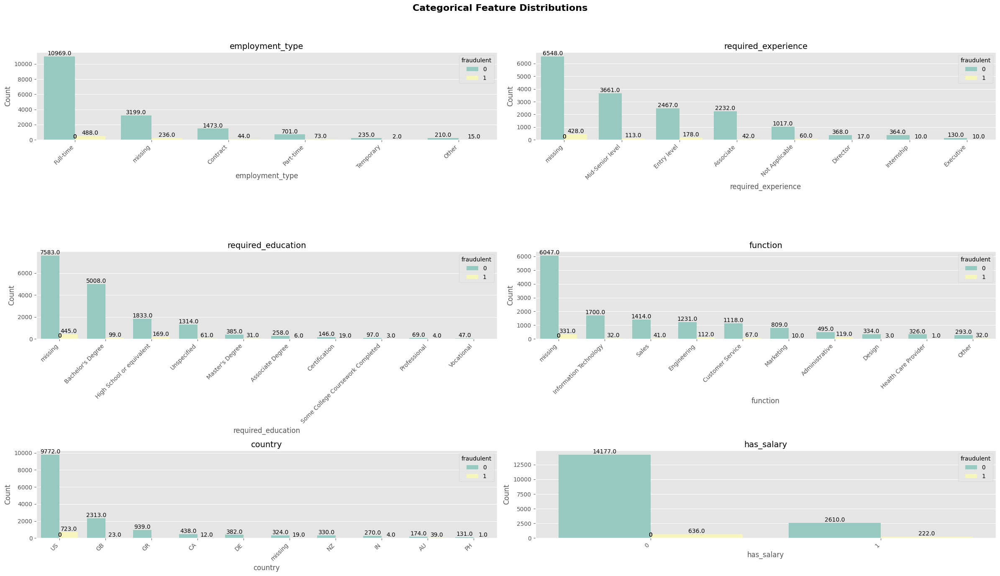

In [18]:
length = len(cat_cols)
cols = 2
rows = length // cols + int(length % cols > 0)

plt.figure(figsize=(24, 14))
plt.suptitle('Categorical Feature Distributions', fontsize=16, fontweight='bold')
for i, col in enumerate(cat_cols):
    plt.subplot(rows, cols, i + 1)
    order = df_clean[col].value_counts().nlargest(10).index
    ax = sns.countplot(data=df_clean, x=col, order=order, palette='Set3', hue=LABEL)
    plt.title(f'{col}', fontsize=14)
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f'{height}', (p.get_x() + p.get_width() / 2., height), 
                    ha='center', va='center', fontsize=10, color='black', xytext=(0, 5), 
                    textcoords='offset points')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


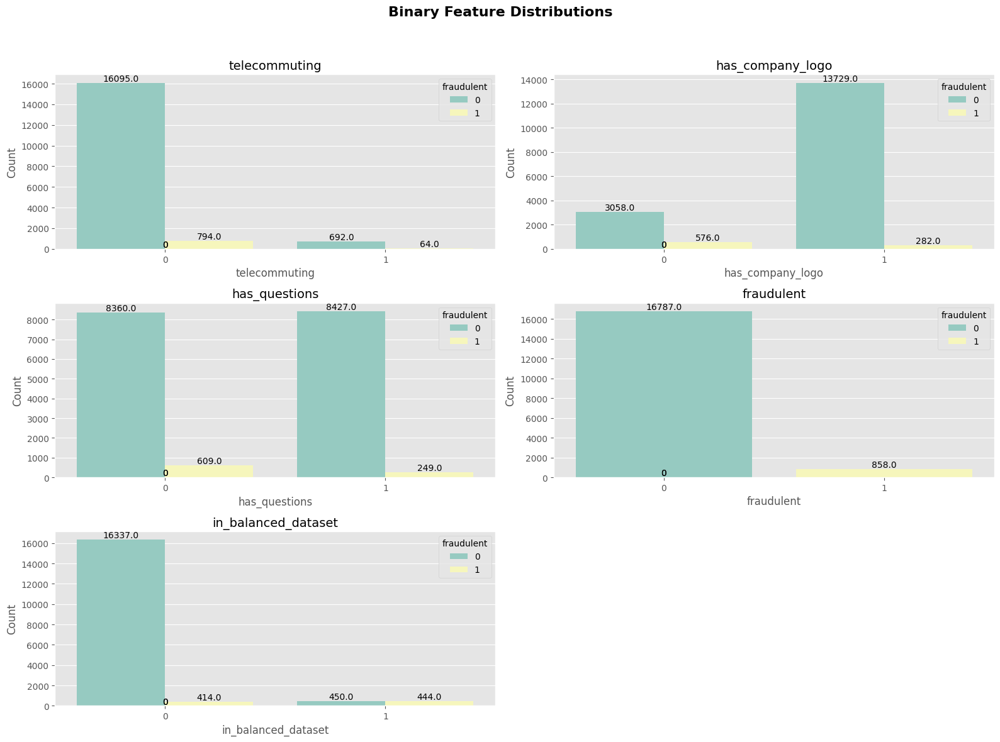

In [58]:
length = len(binary_col)
cols = 2
rows = length // cols + int(length % cols > 0)

plt.figure(figsize=(16, 4 * rows))
plt.suptitle('Binary Feature Distributions', fontsize=16, fontweight='bold')
for i, col in enumerate(binary_col):
    plt.subplot(rows, cols, i + 1)
    ax = sns.countplot(data=df_clean, x=col, palette='Set3', hue=LABEL)
    plt.title(f'{col}', fontsize=14)
    plt.xlabel(col)
    plt.ylabel('Count')
    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f'{height}', (p.get_x() + p.get_width() / 2., height), 
                    ha='center', va='center', fontsize=10, color='black', xytext=(0, 5), 
                    textcoords='offset points')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [37]:
emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  # emoticons
                           u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                           u"\U0001F680-\U0001F6FF"  # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           u"\U00002500-\U00002BEF"  # chinese char
                           u"\U00002702-\U000027B0"
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           u"\U0001f926-\U0001f937"
                           u"\U00010000-\U0010ffff"
                           u"\u2640-\u2642"
                           u"\u2600-\u2B55"
                           u"\u200d"
                           u"\u23cf"
                           u"\u23e9"
                           u"\u231a"
                           u"\ufe0f"  # dingbats
                           u"\u3030"
                           u"\u00ae" # trade Marks ®
                           u"\u00A9" # copy Right ©
                           u"\u2122" # Trade Mark TM
                           u"\u200b"
                           u"\uf0b7"
                           "]+", flags=re.UNICODE)

for col in text_col:
    print(f"Total emojis found in column '{col}': {df_clean[col].apply(lambda x: len(emoji_pattern.findall(x))).sum()}")

Total emojis found in column 'company_profile': 650
Total emojis found in column 'description': 1470
Total emojis found in column 'requirements': 1140
Total emojis found in column 'benefits': 96


In [20]:
emoji_pattern.findall("".join(df_clean['description'].values))

['○',
 '○',
 '○',
 '○',
 '○',
 '○',
 '로서',
 '글로벌',
 '마케팅',
 '전략',
 '수립',
 '한국',
 '일본',
 '대만',
 '등',
 '캠페인',
 '집행',
 '및',
 '관리',
 '채널',
 '마케팅',
 '바이럴마케팅',
 '등',
 '현지법인과',
 '협력하여',
 '진행',
 '캠페인',
 '성과',
 '분석을',
 '통한',
 '광고효율',
 '최적화',
 '및',
 '예산',
 '배분',
 '신규',
 '채널',
 '발굴',
 '및',
 '파트너십',
 '관리',
 '●',
 '●',
 '●',
 '●',
 '●',
 '��',
 '�',
 '��',
 '\uf0fc',
 '\uf0fc',
 '\uf0fc',
 '\uf0fc',
 '\uf0fc',
 '\uf0fc',
 '●',
 '●',
 '●',
 '●',
 '●',
 '●',
 '●',
 '�',
 '�',
 '�',
 '�',
 '�',
 'ﬂ',
 'ﬁ',
 '●',
 '●',
 '●',
 '●',
 '●',
 '●',
 '●',
 '●',
 '●',
 '●',
 '●',
 '●',
 '●',
 '●',
 '●',
 '●',
 '●',
 '●',
 '●',
 '●',
 '●',
 '●',
 '●',
 '●',
 '●',
 '●',
 '●',
 '●',
 '\uf0b7',
 '\uf0b7',
 '\uf0b7',
 '\uf0b7',
 '\uf0b7',
 '\uf0b7',
 '\uf0b7',
 '\uf0b7',
 '\uf09f',
 '버즈빌에서',
 '글로벌',
 '모바일',
 '서비스에',
 '대해',
 '무한한',
 '관심과',
 '열정이',
 '있는',
 '개발자를',
 '찾습니다',
 '잠금화면을',
 '광고',
 '플랫폼으로',
 '활용해',
 '모바일',
 '첫',
 '화면이란',
 '공간을',
 '혁명적으로',
 '변화시키고',
 '있는',
 '버즈빌의',
 '글로벌',
 '서비스를',
 '개발하는',
 '역할입니다',
 '한국에',


In [21]:
text = "I love programming! 😍💻●"
if emoji_pattern.search(text):
    demojized_text = emoji.demojize(text, delimiters=(" "," "))
    demojized_text = re.sub(r'\s+', ' ', demojized_text).strip()
    deleted_emoji = emoji_pattern.sub('', text)
    print(f"Original Text: {text}")
    print(f"Demojized Text: {demojized_text}") 
    print(f"Text after Deleting Emojis: {deleted_emoji}") 

Original Text: I love programming! 😍💻●
Demojized Text: I love programming! smiling_face_with_heart-eyes laptop ●
Text after Deleting Emojis: I love programming! 


In [10]:
def demojize_text(text):
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  # emoticons
                           u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                           u"\U0001F680-\U0001F6FF"  # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           u"\U00002500-\U00002BEF"  # chinese char
                           u"\U00002702-\U000027B0"
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           u"\U0001f926-\U0001f937"
                           u"\U00010000-\U0010ffff"
                           u"\u2640-\u2642"
                           u"\u2600-\u2B55"
                           u"\u200d"
                           u"\u23cf"
                           u"\u23e9"
                           u"\u231a"
                           u"\ufe0f"  # dingbats
                           u"\u3030"
                           u"\u00ae" # trade Marks ®
                           u"\u00A9" # copy Right ©
                           u"\u2122" # Trade Mark TM
                           u"\u200b"
                           u"\uf0b7"
                           "]+", flags=re.UNICODE)

    if emoji_pattern.search(text):
        demojize_text = emoji.demojize(text, delimiters=(" ", " "))
        return re.sub(r'\s+', ' ', demojize_text).strip()
    else:
        return text
    
def delete_emoji(text):
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  # emoticons
                           u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                           u"\U0001F680-\U0001F6FF"  # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           u"\U00002500-\U00002BEF"  # chinese char
                           u"\U00002702-\U000027B0"
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           u"\U0001f926-\U0001f937"
                           u"\U00010000-\U0010ffff"
                           u"\u2640-\u2642"
                           u"\u2600-\u2B55"
                           u"\u200d"
                           u"\u23cf"
                           u"\u23e9"
                           u"\u231a"
                           u"\ufe0f"  # dingbats
                           u"\u3030"
                           u"\u00ae" # trade Marks ®
                           u"\u00A9" # copy Right ©
                           u"\u2122" # Trade Mark TM
                           u"\u200b"
                           u"\uf0b7"
                           "]+", flags=re.UNICODE)
    return emoji_pattern.sub('', text)


In [11]:
def normalize_unicode(text):
    text = ftfy.fix_text(text)
    return "".join(
        c for c in unicodedata.normalize('NFKD', text)
        if not unicodedata.combining(c)
    )
    

In [12]:
def remove_hyphens(text):
    pattern = re.compile(r'\b(\w+)[-—‑–](\w+)\b')  

    text = pattern.sub(r'\1 \2', text)
    
    return text

def remove_currency_symbols(text):
    pattern = re.compile(r'[$€¥₹£¢₽₩₪₴₱₨฿₦₮₲₭₵₿]')  

    text = pattern.sub(' ', text)
    
    return text

def remove_bullet_points(text):
    pattern = re.compile(r'\s*[\u2022\u2023\u25E6]\s*')  

    text = pattern.sub(' ', text)
    
    return text

In [17]:
def cleaned_text(text):
    text = normalize_unicode(text)
    text = demojize_text(text)
    text = delete_emoji(text)

    text = text.lower()
    text = re.sub(r'[\t\r]', ' ', text)
    text = re.sub(r'<b>', ' ', text)  
    text = re.sub(r'</b>', ' ', text)  
    text = re.sub(r'<i>', ' ', text)
    text = re.sub(r'</i>', ' ', text)
    text = re.sub(r'<br>', ' ', text)
    text = re.sub(r'([^.?!])\s*</br>', r'\1.</br>', text)
    text = re.sub(r'([^.?!])\s*</p>', r'\1.</p>', text)
    text = re.sub(r'\s*=\s*', '=', text)
    text = re.sub(r'<a href=.*?>', '', text)
    text = re.sub(r'</a>', '', text)
    text = re.sub(r'\(#URL.*?#\)', '', text)
    text = re.sub(r'\s+[\w-]+=".*?"', '', text)
    text = re.sub(r'\s*(?:\d+\.|[-*+])\s+', ' ', text)
    text = re.sub(r"(.)\1{2,}", r"\1", text)
    text = re.sub(r"http?://\S+|www\.\S+|https?://\S+|pic\.twitter\.com/\S+", '', text)
    text = remove_hyphens(text)
    text = remove_currency_symbols(text)
    text = remove_bullet_points(text)

    CONTRACTION_MAP = {
        r"\bwon\'t\b": "will not",
        r"\bcan\'t\b": "cannot",
        r"\bshan\'t\b": "shall not",
        r"\bain\'t\b": "is not",
        
        r"\bcan t\b": "cannot",
        r"\bdon t\b": "do not",
        r"\bit s\b": "it is",
        r"\bi m\b": "i am",

        r"n\'t\b": " not",
        r"\'re\b": " are",
        r"\'s\b": " is",     
        r"\'d\b": " would",   
        r"\'ll\b": " will",
        r"\'t\b": " not",
        r"\'ve\b": " have",
        r"\'m\b": " am",
    }

    SLANG_MAP = {
        r"\bgonna\b": "going to",
        r"\bgon na\b": "going to",
        r"\bwanna\b": "want to",
        r"\bwan na\b": "want to",
        r"\brn\b": "right now",
        r"\bidk\b": "i do not know",
        r"\bim\b": "i am",      
        r"\bu\b": "you",
        r"\bur\b": "your",
        r"\bthx\b": "thanks",
    }

    
    FULL_MAP = {**CONTRACTION_MAP, **SLANG_MAP}
    for pattern, replacement in FULL_MAP.items():
        text = re.sub(pattern, replacement, text)

    punc_list = [p for p in ['!\xad\xa0\xe2\x80\x9d\xe2\x80\x99\xe2\x80\xa2()*+-/:;=[]^_`{|}~@#,.?$%&"”“’‘\'…«»–']]
    punc_str = "".join(punc_list)
    safe_punc_pattern = rf'[ {re.escape(punc_str)} ]'
    text = re.sub(safe_punc_pattern, ' ', text)
    text = re.sub(r'\s+', ' ', text).strip()

    return text

def extract_points(text):
    pattern = r'<(p|li)[^>]*>(.*?)</\1>'
    
    matches = re.findall(pattern, text, flags=re.DOTALL | re.IGNORECASE)
    
    if matches:
        cleaned_points = []
        for tag, content in matches:
            clean_content = re.sub(r'<.*?>', ' ', content)
            clean_content = re.sub(r'\s+', ' ', clean_content).strip()

            cleaned_points.append(clean_content)
            
        return '. '.join(cleaned_points)
    else:
        clean_content = re.sub(r'<.*?>', ' ', text)
        return re.sub(r'\s+', ' ', clean_content).strip()


for col in text_col:
    df_clean[f'{col}_cleaned'] = df_clean[col].apply(lambda x: cleaned_text(x))
    df_clean[f'{col}_cleaned'] = df_clean[f'{col}_cleaned'].apply(lambda x: extract_points(x))

df_clean.head()

,company_profile,description,requirements,benefits,telecommuting,has_company_logo,has_questions,employment_type,required_experience,required_education,function,fraudulent,in_balanced_dataset,country,has_salary,company_profile_cleaned,description_cleaned,requirements_cleaned,benefits_cleaned
0,"<h3>We're Food52, and we've created a groundbr...","<p>Food52, a fast-growing, James Beard Award-w...",<ul>\r\n<li>Experience with content management...,missing,0,1,0,Other,Internship,missing,Marketing,0,0,US,0,we are food52 and we have created a groundbrea...,food52 a fast growing james beard award winnin...,experience with content management systems a m...,missing
1,"<h3>90 Seconds, the worlds Cloud Video Product...",<p>Organised - Focused - Vibrant - Awesome!<br...,<p><b>What we expect from you:</b></p>\r\n<p>Y...,<h3><b>What you will get from us</b></h3>\r\n<...,0,1,0,Full-time,Not Applicable,missing,Customer Service,0,0,NZ,0,90 seconds the worlds cloud video production s...,organised focused vibrant awesome do you have ...,what we expect from you your key responsibilit...,what you will get from us through being part o...
2,<h3></h3>\r\n<p>Valor Services provides Workfo...,"<p>Our client, located in Houston, is actively...",<ul>\r\n<li>Implement pre-commissioning and co...,missing,0,1,0,missing,missing,missing,missing,0,0,US,0,valor services provides workforce solutions th...,our client located in houston is actively seek...,implement pre commissioning and commissioning ...,missing
3,<p>Our passion for improving quality of life t...,<p><b>THE COMPANY: ESRI – Environmental System...,<ul>\r\n<li>\r\n<b>EDUCATION: </b>Bachelor’s o...,<p>Our culture is anything but corporate—we ha...,0,1,0,Full-time,Mid-Senior level,Bachelor's Degree,Sales,0,0,US,0,our passion for improving quality of life thro...,the company esri environmental systems researc...,education bachelor is or master is in gis busi...,our culture is anything but corporate we have ...
4,<p>SpotSource Solutions LLC is a Global Human ...,<p><b>JOB TITLE:</b> Itemization Review Manage...,<p><b>QUALIFICATIONS:</b></p>\r\n<ul>\r\n<li>R...,<p>Full Benefits Offered</p>,0,1,1,Full-time,Mid-Senior level,Bachelor's Degree,Health Care Provider,0,0,US,0,spotsource solutions llc is a global human cap...,job title itemization review manager location ...,qualifications right now license in the state ...,full benefits offered


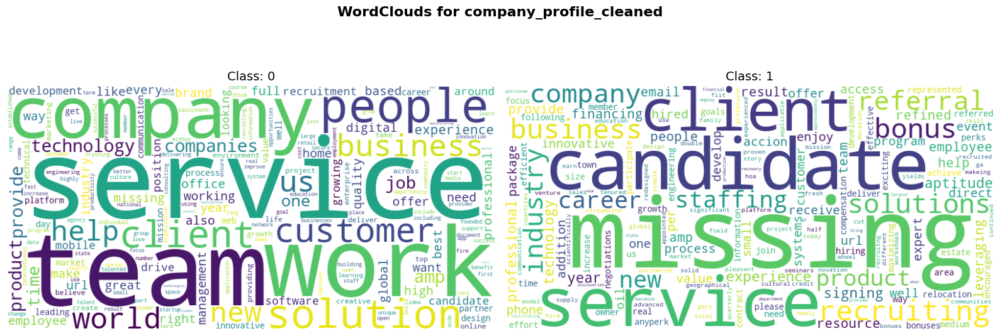

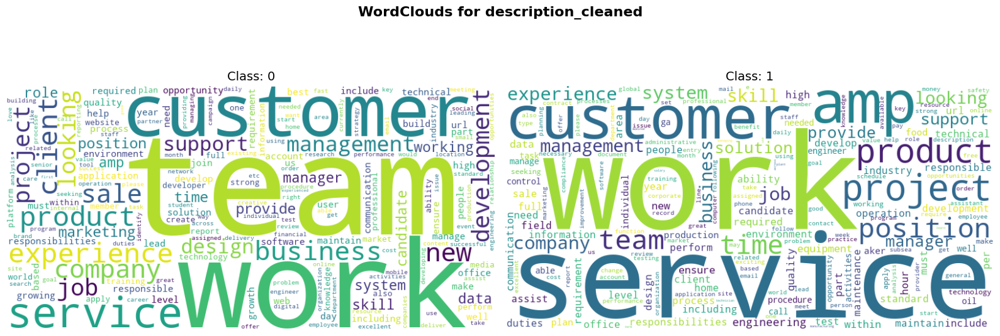

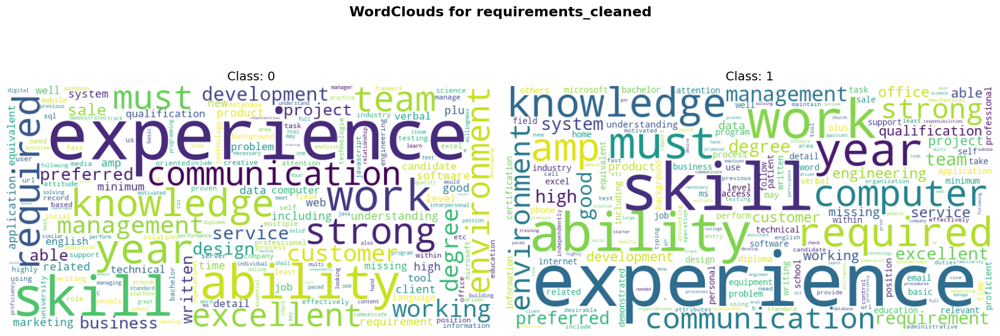

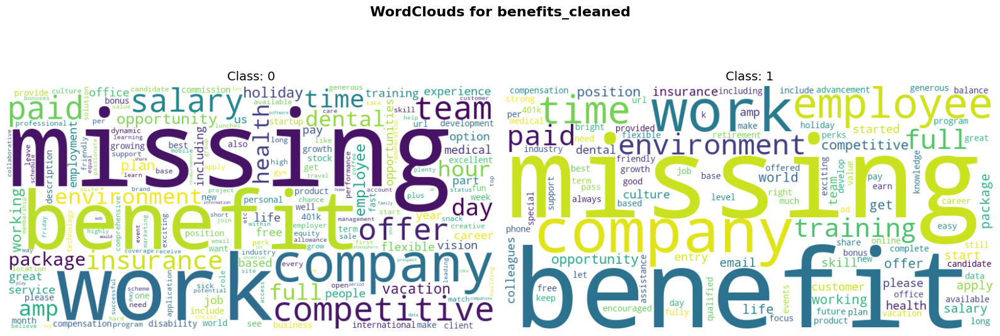

In [28]:
STOPWORDS = set(stopwords.words('english'))

def wordcloud_plot(col, label):
    length = len(df[label].unique())
    cols = 2
    rows = length // cols + int(length % cols > 0)
    plt.figure(figsize=(16, 6 * rows))
    plt.suptitle(f'WordClouds for {col}', fontsize=16, fontweight='bold')
    for i, l in enumerate(df[label].unique()):
        plt.subplot(rows, cols, i + 1)
        text = " ".join(df_clean[df_clean[label] == l][col].values)
        wordcloud = WordCloud(width=800, height=400, background_color='white', stopwords=STOPWORDS, collocations=False).generate(text)
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'Class: {l}', fontsize=14)
        plt.axis('off')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

for col in text_col:
    wordcloud_plot(f'{col}_cleaned', LABEL)

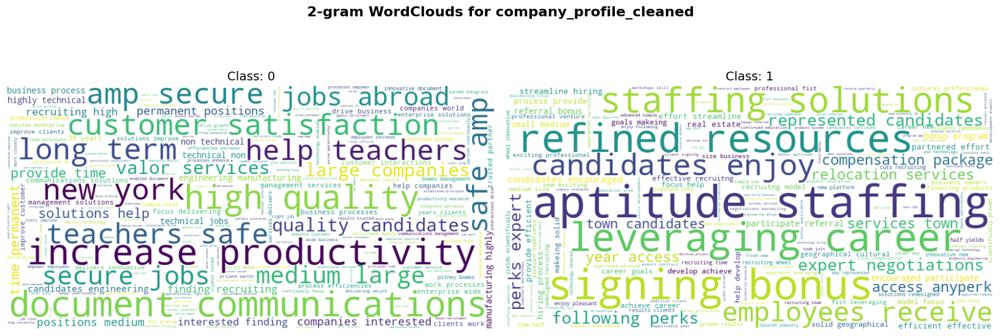

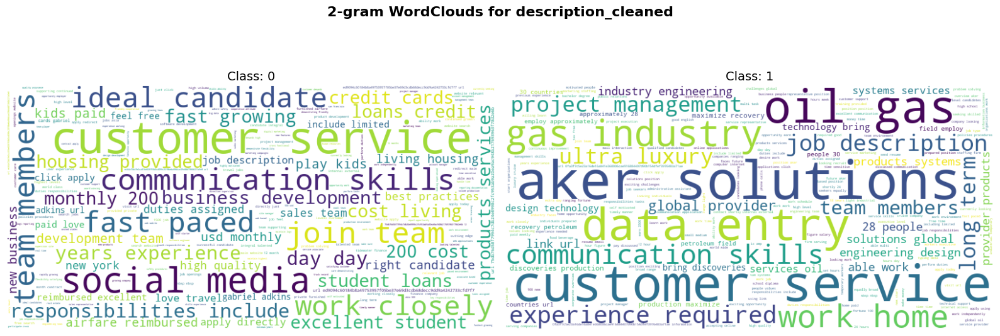

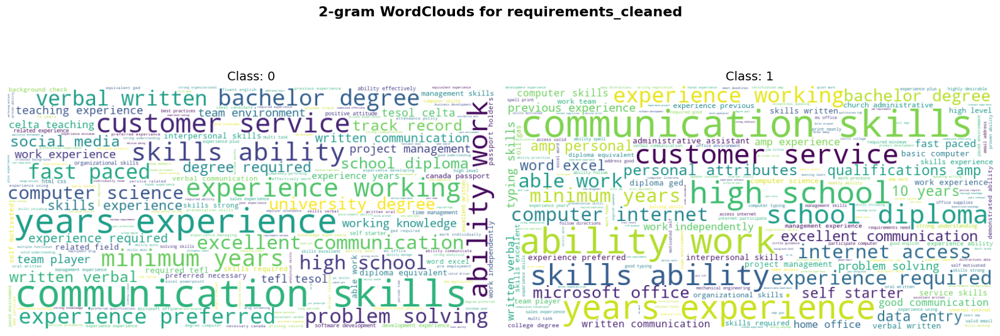

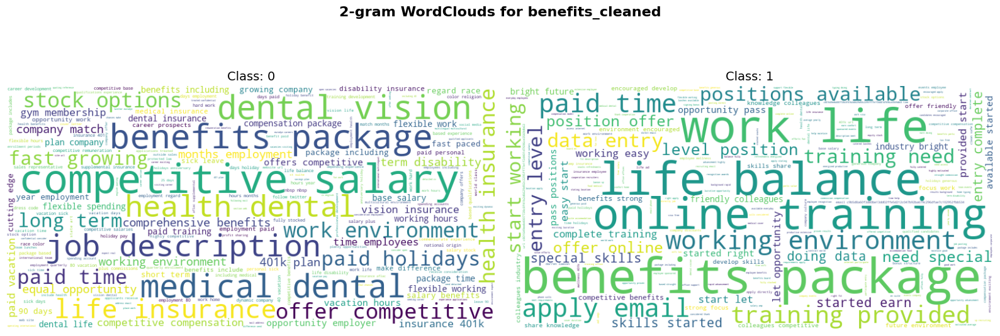

In [29]:
def wordcloud_plot_ngram(col, label, n=2):
    length = len(df[label].unique())
    cols = 2
    rows = length // cols + int(length % cols > 0)
    plt.figure(figsize=(16, 6 * rows))
    plt.suptitle(f'{n}-gram WordClouds for {col}', fontsize=16, fontweight='bold')
    for i, l in enumerate(df[label].unique()):
        plt.subplot(rows, cols, i + 1)
        text = df_clean[df_clean[label] == l][col].values
        vectorizer = CountVectorizer(ngram_range=(n, n), stop_words='english')
        X = vectorizer.fit_transform(text)
        sum_words = X.sum(axis=0)
        words_freq = [(word, sum_words[0, idx]) for word, idx in vectorizer.vocabulary_.items()]
        words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
        wordcloud = WordCloud(width=800, height=400, background_color='white', collocations=False).generate_from_frequencies(dict(words_freq))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'Class: {l}', fontsize=14)
        plt.axis('off')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

for col in text_col:
    wordcloud_plot_ngram(f'{col}_cleaned', LABEL, n=2)

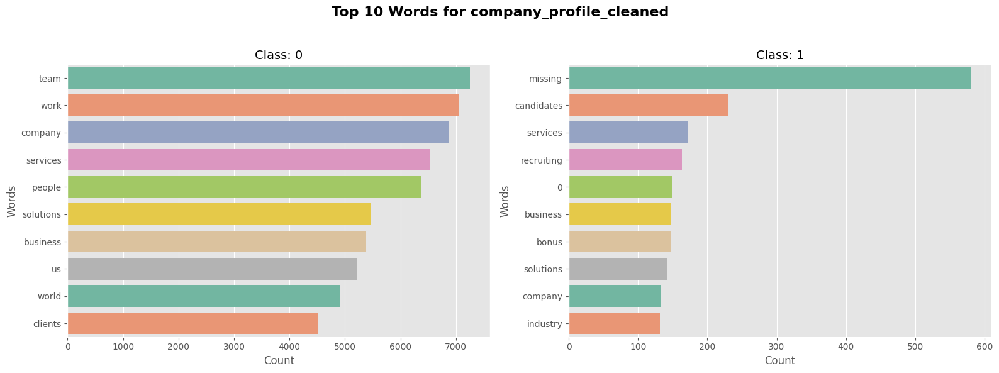

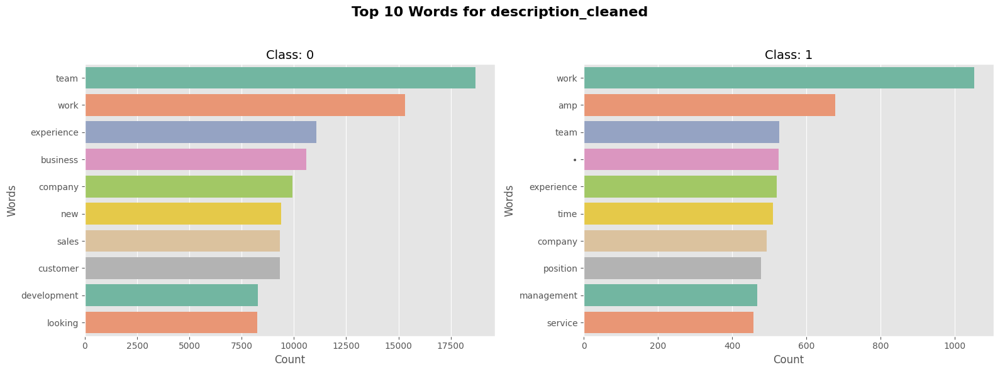

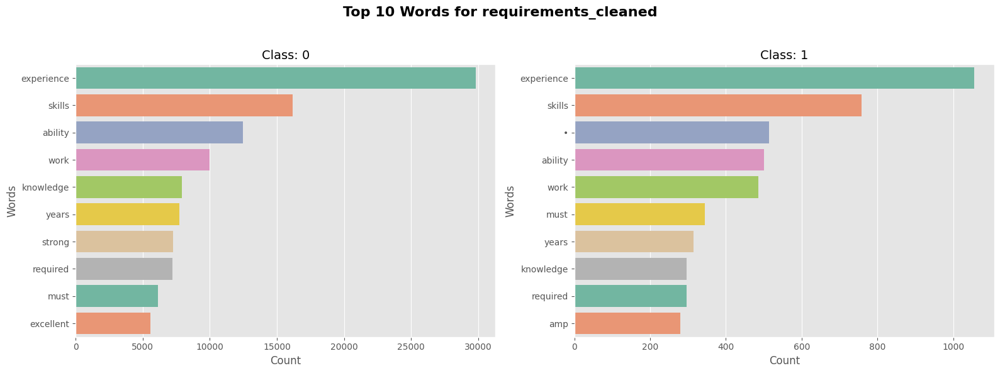

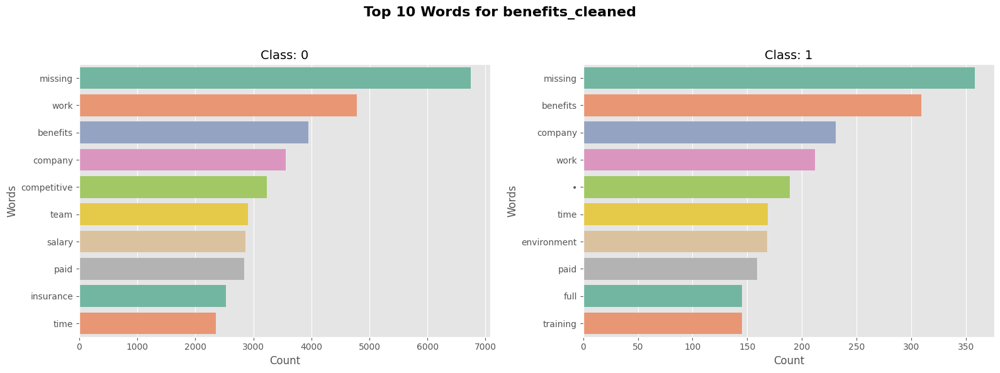

In [31]:
def top_n_word_plot(col, label, n=10):
    length = len(df[label].unique())
    cols = 2
    rows = length // cols + int(length % cols > 0)
    plt.figure(figsize=(16, 6 * rows))
    plt.suptitle(f'Top {n} Words for {col}', fontsize=16, fontweight='bold')
    for i, l in enumerate(df[label].unique()):
        plt.subplot(rows, cols, i + 1)
        text = " ".join(df_clean[df_clean[label] == l][col].values)
        words = word_tokenize(text)
        words = [word for word in words if word not in STOPWORDS]
        word_counts = Counter(words)
        common_words = word_counts.most_common(n)
        words, counts = zip(*common_words)
        sns.barplot(x=list(counts), y=list(words), palette='Set2')
        plt.title(f'Class: {l}', fontsize=14)
        plt.xlabel('Count')
        plt.ylabel('Words')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

for col in text_col:
    top_n_word_plot(f'{col}_cleaned', LABEL, n=10)

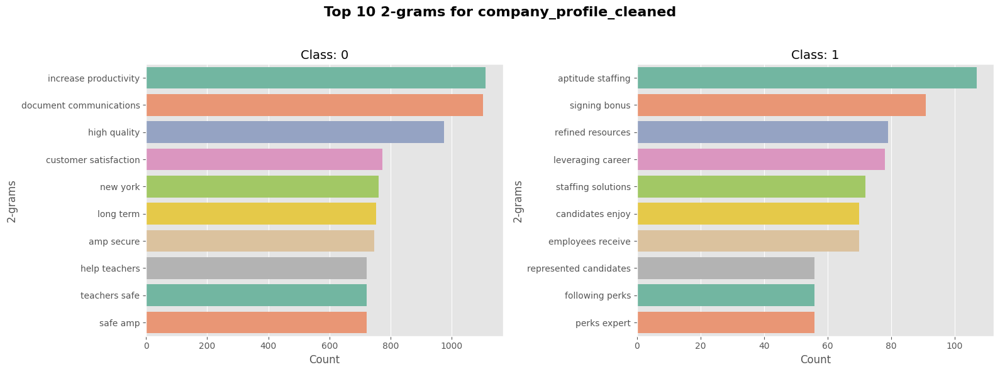

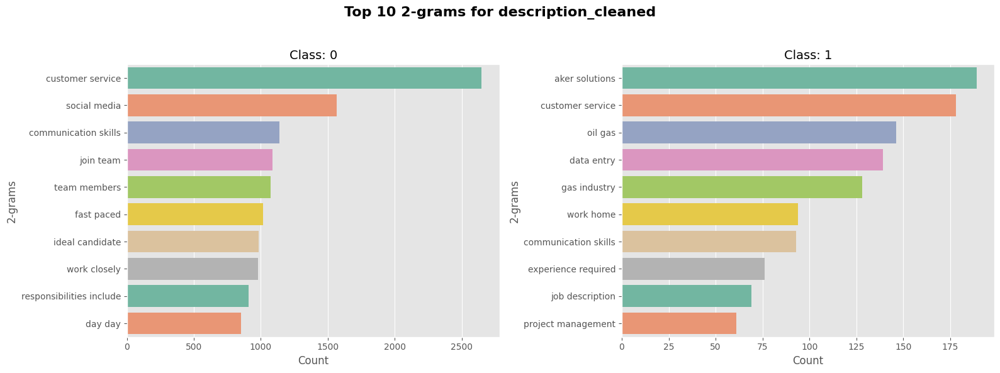

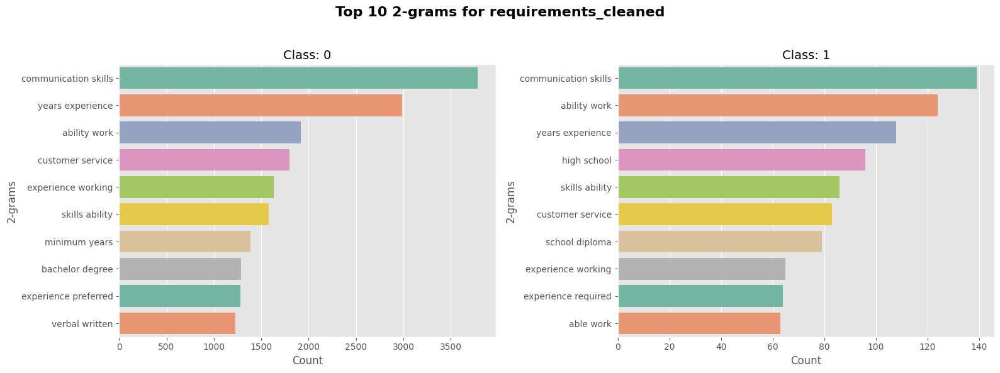

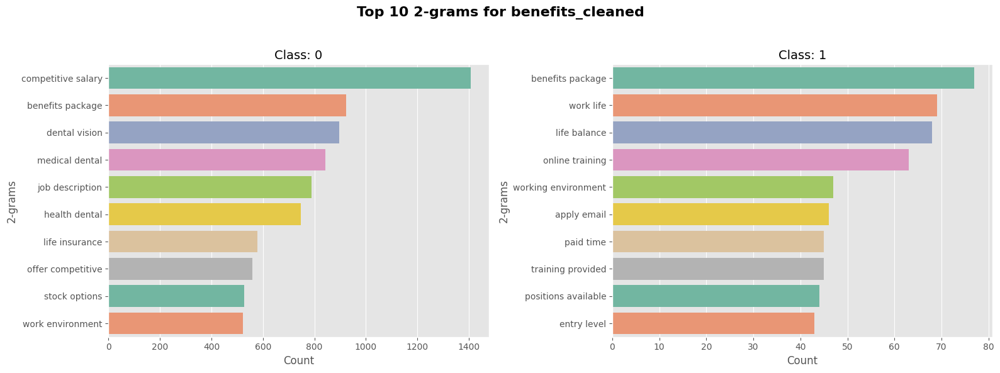

In [32]:
def top_n_word_ngram_plot(col, label, n=10, gram=2):
    length = len(df[label].unique())
    cols = 2
    rows = length // cols + int(length % cols > 0)
    plt.figure(figsize=(16, 6 * rows))
    plt.suptitle(f'Top {n} {gram}-grams for {col}', fontsize=16, fontweight='bold')
    for i, l in enumerate(df[label].unique()):
        plt.subplot(rows, cols, i + 1)
        text = df_clean[df_clean[label] == l][col].values
        vectorizer = CountVectorizer(ngram_range=(gram, gram), stop_words='english')
        X = vectorizer.fit_transform(text)
        sum_words = X.sum(axis=0)
        words_freq = [(word, sum_words[0, idx]) for word, idx in vectorizer.vocabulary_.items()]
        words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)[:n]
        words, counts = zip(*words_freq)
        sns.barplot(x=list(counts), y=list(words), palette='Set2')
        plt.title(f'Class: {l}', fontsize=14)
        plt.xlabel('Count')
        plt.ylabel(f'{gram}-grams')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

for col in text_col:
    top_n_word_ngram_plot(f'{col}_cleaned', LABEL, n=10, gram=2)

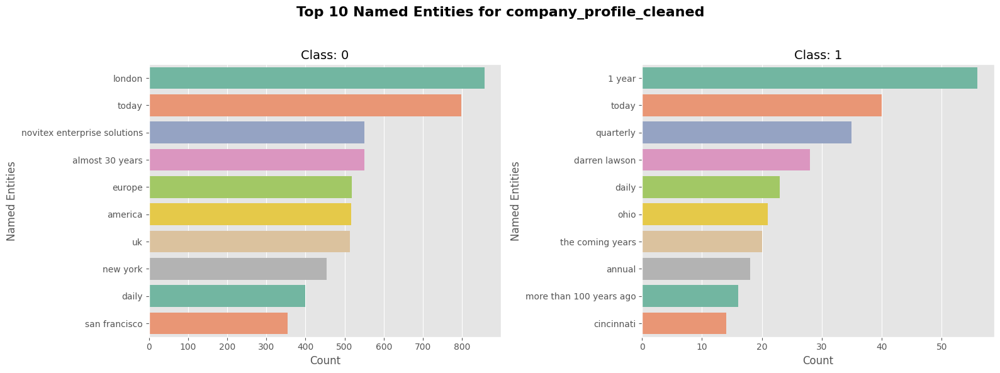

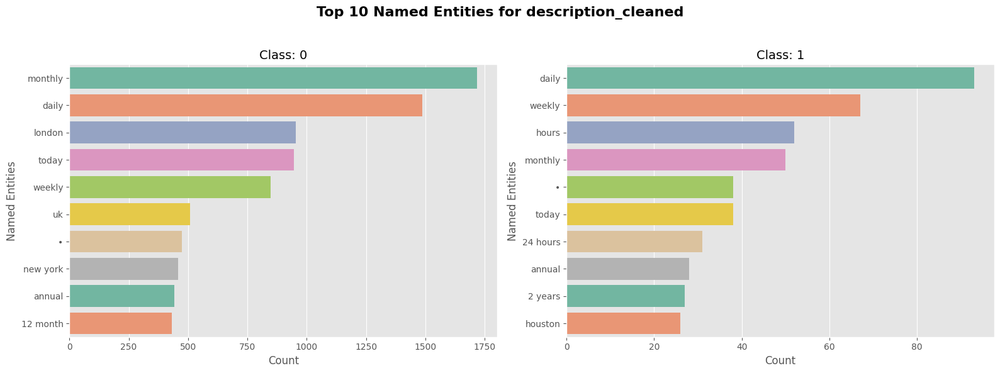

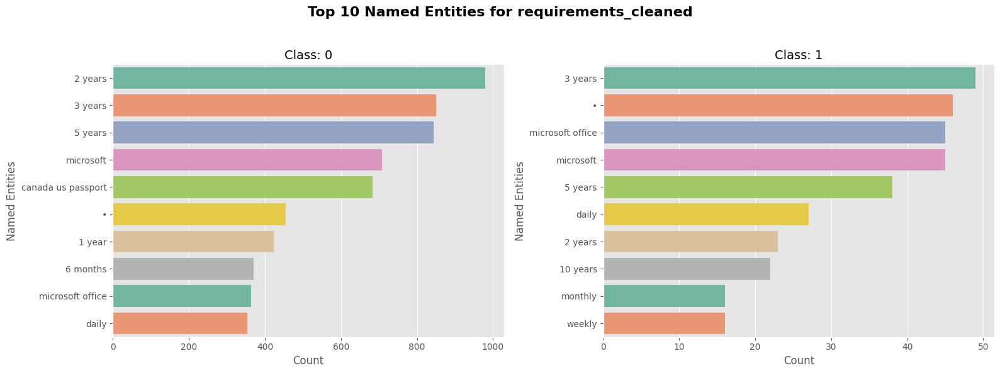

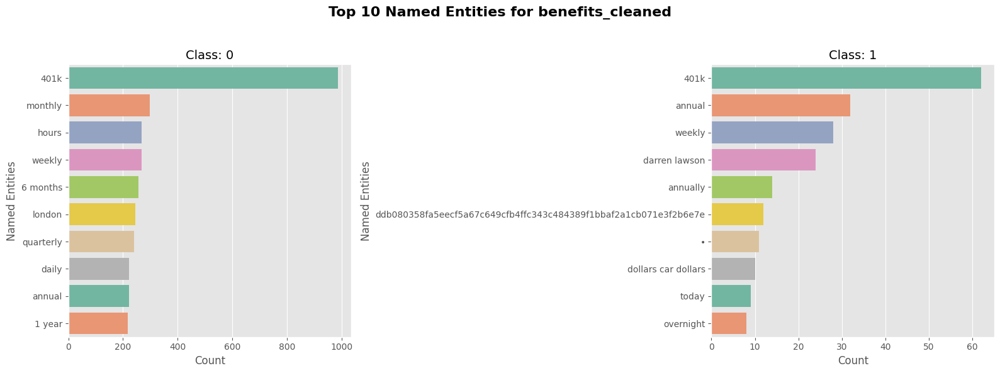

In [38]:
def ner_frequency_bar_plot(col, label, n=10, allowed_entities=None):
    import spacy
    from collections import Counter
    import seaborn as sns
    import matplotlib.pyplot as plt

    nlp = spacy.load("en_core_web_sm")
    nlp.max_length = 20_000_000

    if allowed_entities is not None:
        allowed_entities = set(allowed_entities)

    unique_labels = df_clean[label].unique()
    length = len(unique_labels)
    cols = 2
    rows = (length // cols) + int(length % cols > 0)

    plt.figure(figsize=(16, 6 * rows))
    plt.suptitle(f'Top {n} Named Entities for {col}', fontsize=16, fontweight='bold')

    for i, l in enumerate(unique_labels):
        subset = df_clean[df_clean[label] == l][col].dropna().values

        entities = []
        for doc in nlp.pipe(subset, disable=["parser"]):
            if allowed_entities:
                entities.extend([ent.text for ent in doc.ents if ent.label_ in allowed_entities])
            else:
                entities.extend([ent.text for ent in doc.ents])

        entity_counts = Counter(entities).most_common(n)

        plt.subplot(rows, cols, i + 1)
        if len(entity_counts) > 0:
            ents, counts = zip(*entity_counts)
            sns.barplot(x=list(counts), y=list(ents), palette='Set2')
        else:
            plt.text(0.5, 0.5, 'No entities found', ha='center', va='center')

        plt.title(f'Class: {l}', fontsize=14)
        plt.xlabel('Count')
        plt.ylabel('Named Entities')

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

allowed_entities = ['PERSON', 'ORG', 'GPE', 'LOC', 'PRODUCT', 'EVENT', 'WORK_OF_ART', 'LAW', 'MONEY', 'DATE', 'TIME']
for col in text_col:
    ner_frequency_bar_plot(f'{col}_cleaned', LABEL, n=10, allowed_entities=allowed_entities)



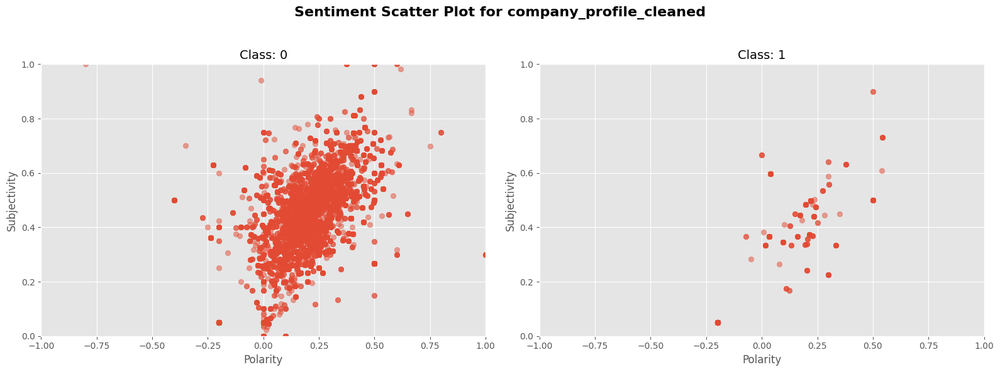

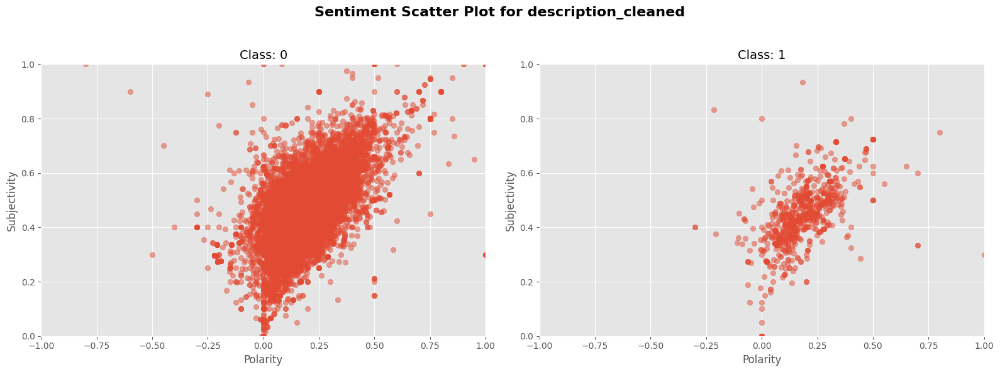

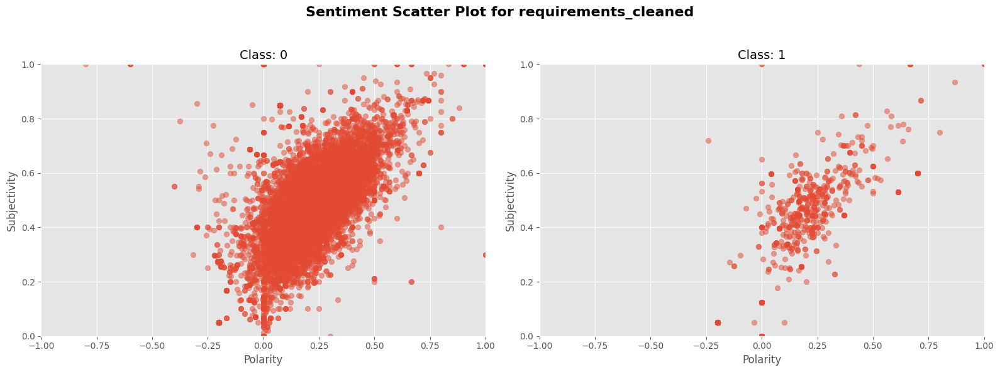

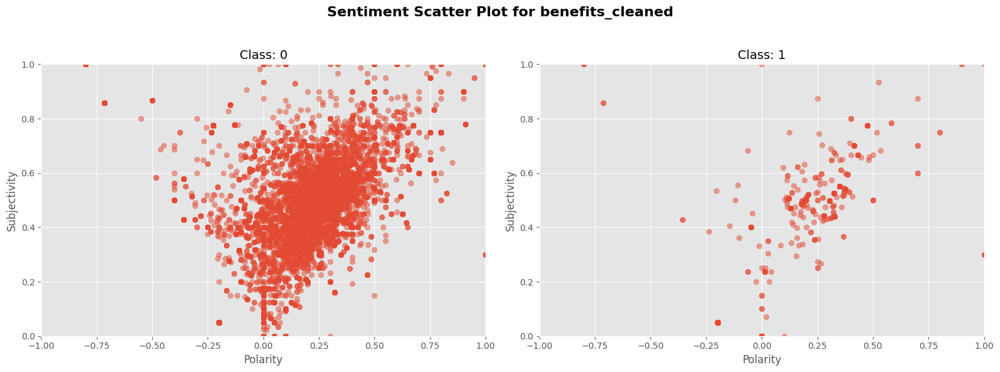

In [46]:
def sentiment_scatter_plot(col, label):
    length = len(df[label].unique())
    cols = 2
    rows = length // cols + int(length % cols > 0)
    plt.figure(figsize=(16, 6 * rows))
    plt.suptitle(f'Sentiment Scatter Plot for {col}', fontsize=16, fontweight='bold')
    for i, l in enumerate(df[label].unique()):
        plt.subplot(rows, cols, i + 1)
        texts = df_clean[df_clean[label] == l][col].values
        polarities = []
        subjectivities = []
        for text in texts:
            blob = TextBlob(text)
            polarities.append(blob.sentiment.polarity)
            subjectivities.append(blob.sentiment.subjectivity)
        plt.scatter(polarities, subjectivities, alpha=0.5)
        plt.title(f'Class: {l}', fontsize=14)
        plt.xlabel('Polarity')
        plt.ylabel('Subjectivity')
        plt.xlim(-1, 1)
        plt.ylim(0, 1)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
for col in text_col:
    sentiment_scatter_plot(f'{col}_cleaned', LABEL)

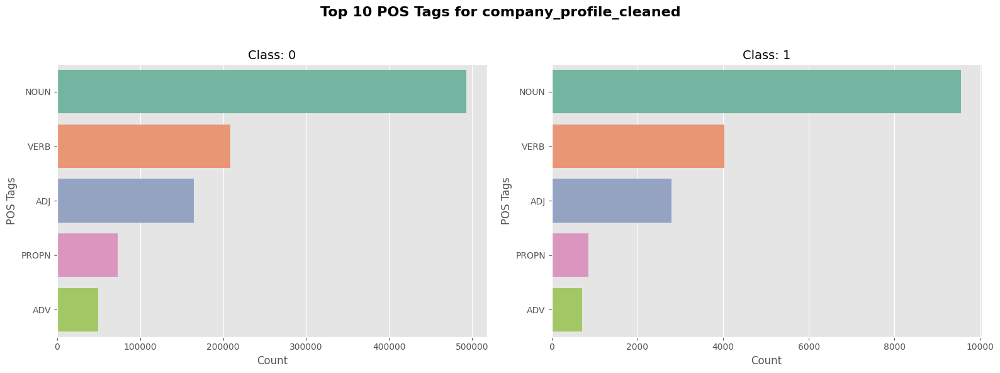

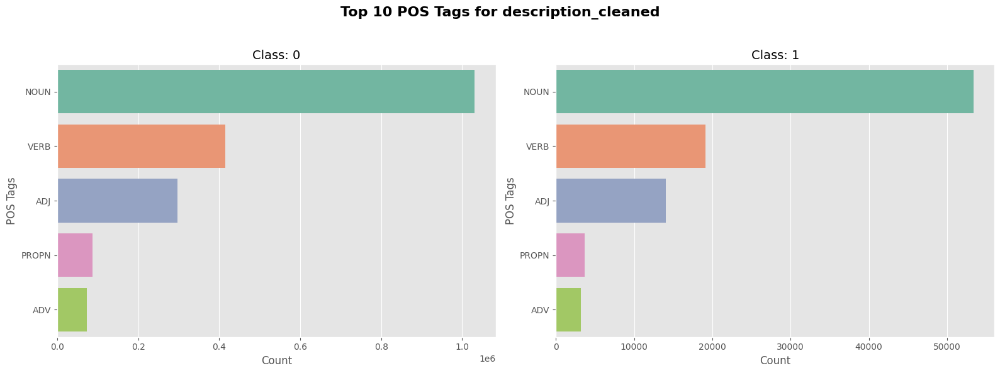

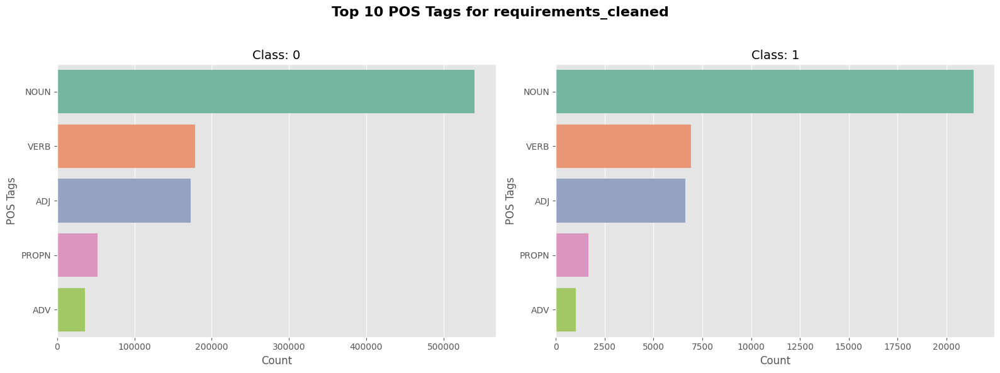

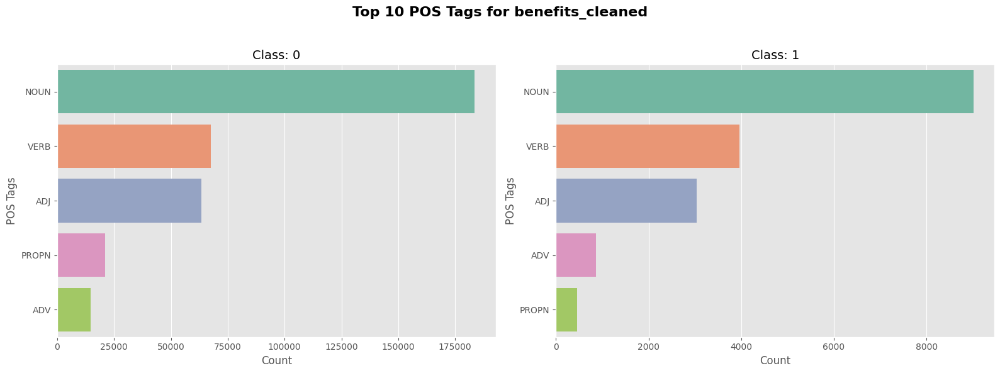

In [47]:
def POS_tagging_bar_plot(col, label, n=10, allowed_pos=None):
    import spacy
    from collections import Counter
    import seaborn as sns
    import matplotlib.pyplot as plt

    nlp = spacy.load("en_core_web_sm")
    nlp.max_length = 20_000_000

    if allowed_pos is not None:
        allowed_pos = set(allowed_pos)

    unique_labels = df_clean[label].unique()
    length = len(unique_labels)
    cols = 2
    rows = (length // cols) + int(length % cols > 0)

    plt.figure(figsize=(16, 6 * rows))
    plt.suptitle(f'Top {n} POS Tags for {col}', fontsize=16, fontweight='bold')

    for i, l in enumerate(unique_labels):
        subset = df_clean[df_clean[label] == l][col].dropna().values

        pos_tags = []
        for doc in nlp.pipe(subset, disable=["ner", "parser"]):
            if allowed_pos:
                pos_tags.extend([token.pos_ for token in doc if token.pos_ in allowed_pos])
            else:
                pos_tags.extend([token.pos_ for token in doc])

        pos_counts = Counter(pos_tags).most_common(n)

        plt.subplot(rows, cols, i + 1)
        if len(pos_counts) > 0:
            tags, counts = zip(*pos_counts)
            sns.barplot(x=list(counts), y=list(tags), palette='Set2')
        else:
            plt.text(0.5, 0.5, 'No POS tags found', ha='center', va='center')

        plt.title(f'Class: {l}', fontsize=14)
        plt.xlabel('Count')
        plt.ylabel('POS Tags')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

allowed_pos = ['NOUN', 'VERB', 'ADJ', 'ADV', 'PROPN']
for col in text_col:
    POS_tagging_bar_plot(f'{col}_cleaned', LABEL, n=10, allowed_pos=allowed_pos)

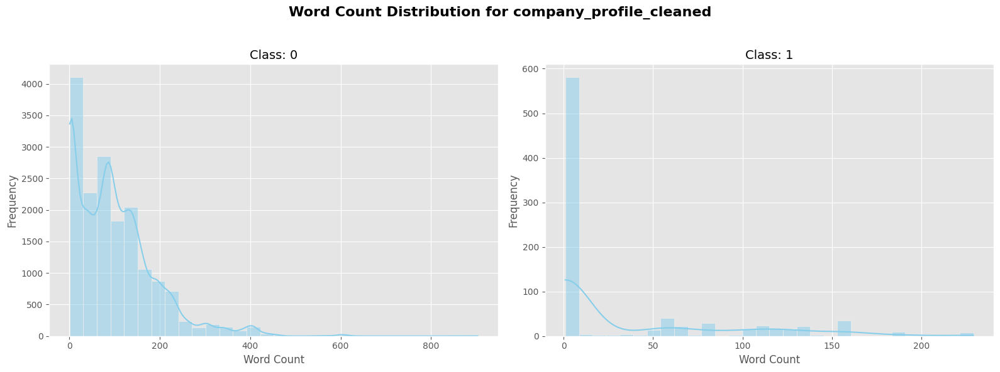

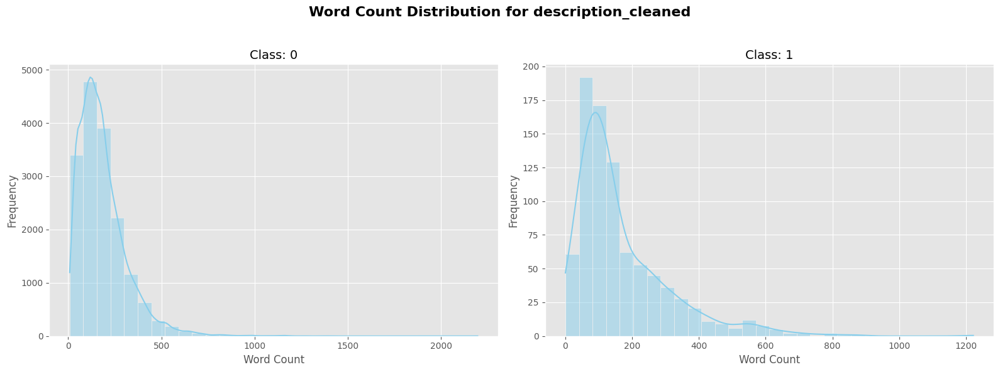

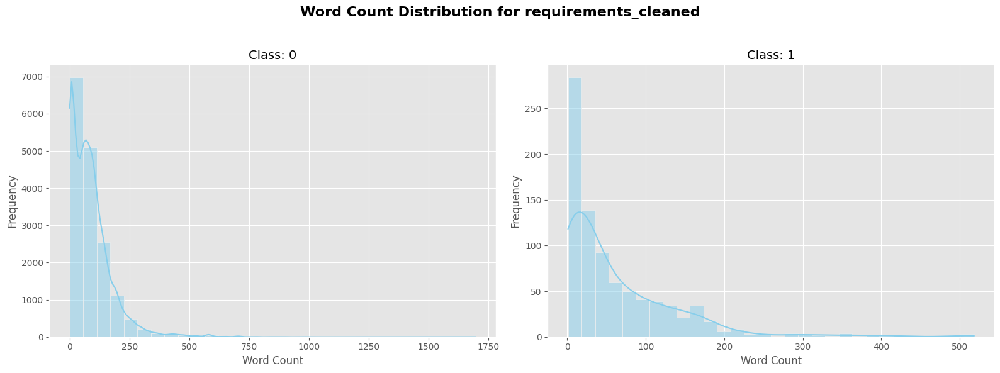

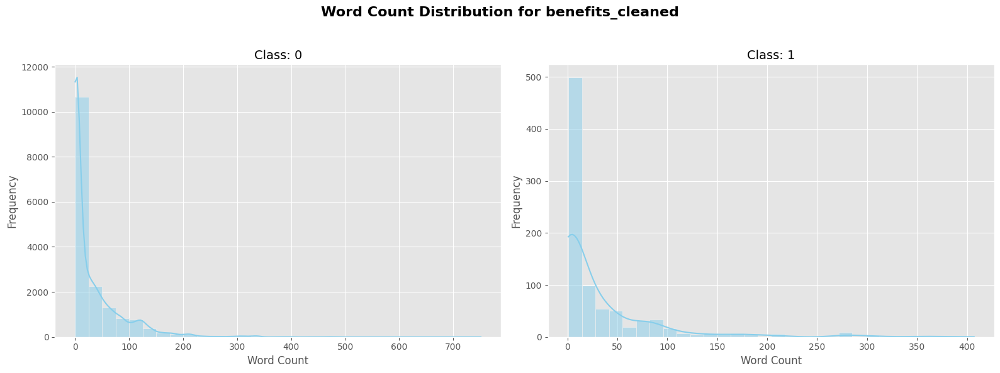

In [48]:
def word_count_plot(col, label):
    length = len(df[label].unique())
    cols = 2
    rows = length // cols + int(length % cols > 0)
    plt.figure(figsize=(16, 6 * rows))
    plt.suptitle(f'Word Count Distribution for {col}', fontsize=16, fontweight='bold')
    for i, l in enumerate(df[label].unique()):
        plt.subplot(rows, cols, i + 1)
        texts = df_clean[df_clean[label] == l][col].values
        word_counts = [len(word_tokenize(text)) for text in texts]
        sns.histplot(word_counts, bins=30, kde=True, color='skyblue')
        plt.title(f'Class: {l}', fontsize=14)
        plt.xlabel('Word Count')
        plt.ylabel('Frequency')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
for col in text_col:
    word_count_plot(f'{col}_cleaned', LABEL)

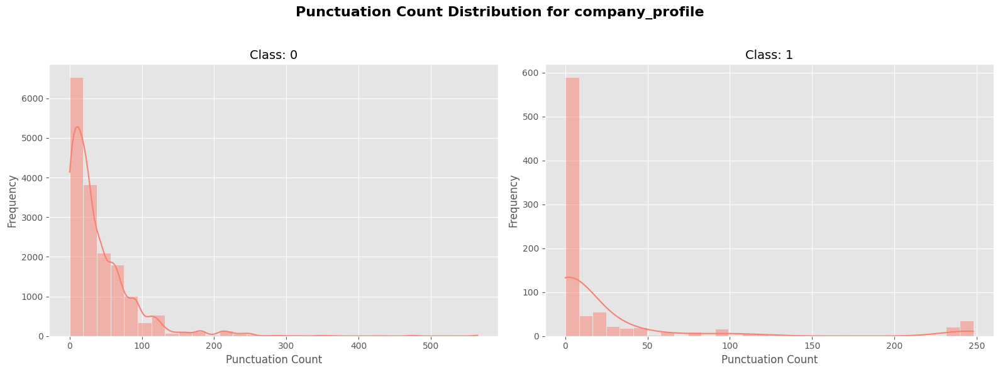

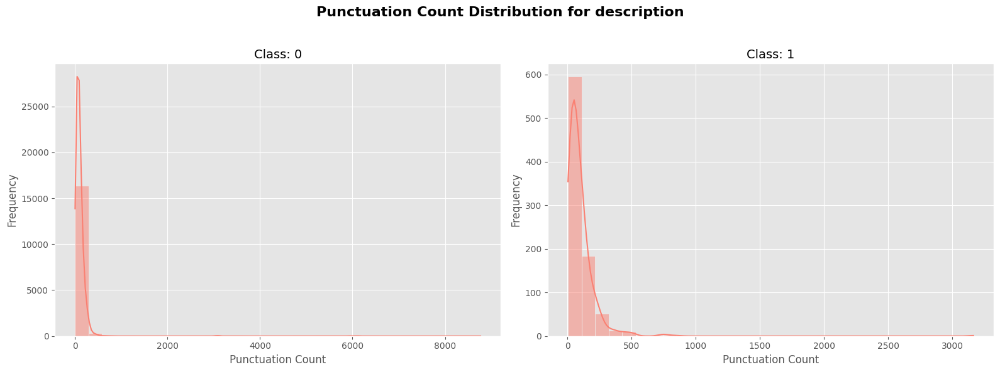

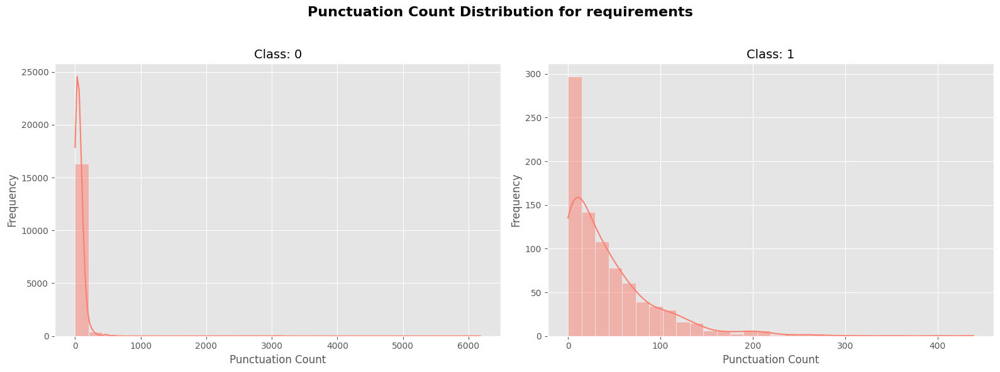

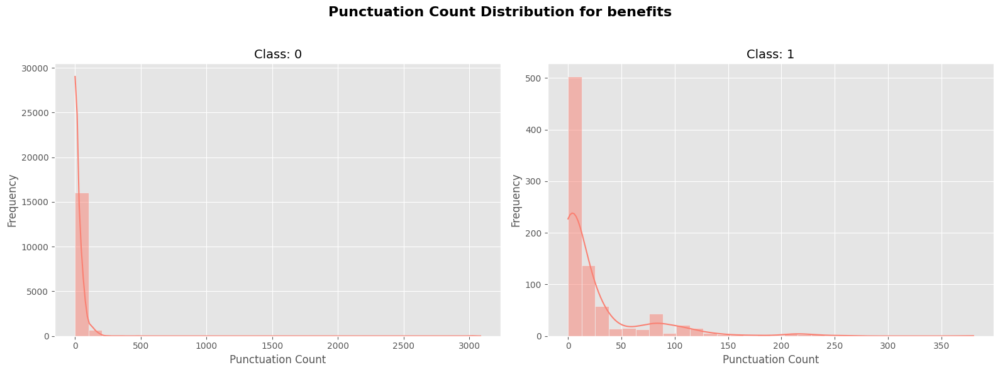

In [52]:
def punctuation_count_plot(col, label):
    length = len(df[label].unique())
    cols = 2
    rows = length // cols + int(length % cols > 0)
    plt.figure(figsize=(16, 6 * rows))
    plt.suptitle(f'Punctuation Count Distribution for {col}', fontsize=16, fontweight='bold')
    for i, l in enumerate(df[label].unique()):
        plt.subplot(rows, cols, i + 1)
        texts = df_clean[df_clean[label] == l][col].values
        punct_counts = [len([char for char in text if char in string.punctuation]) for text in texts]
        sns.histplot(punct_counts, bins=30, kde=True, color='salmon')
        plt.title(f'Class: {l}', fontsize=14)
        plt.xlabel('Punctuation Count')
        plt.ylabel('Frequency')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
    
for col in text_col:
    punctuation_count_plot(f'{col}', LABEL)

In [18]:
df_clean['full_text'] = df_clean['company_profile_cleaned'] + ' - ' + df_clean['description_cleaned'] + ' - ' + df_clean['requirements_cleaned'] + ' - ' + df_clean['benefits_cleaned']
df_clean['full_text'].head()

0    we are food52 and we have created a groundbrea...
1    90 seconds the worlds cloud video production s...
2    valor services provides workforce solutions th...
3    our passion for improving quality of life thro...
4    spotsource solutions llc is a global human cap...
Name: full_text, dtype: object

In [19]:
MODEL_NAME = "paraphrase-multilingual-mpnet-base-v2"  
embedder = SentenceTransformer(MODEL_NAME)
texts = df_clean['full_text'].tolist()
embeddings = embedder.encode(texts, show_progress_bar=True, convert_to_numpy=True)
embeddings.shape

modules.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/723 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.11G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/402 [00:00<?, ?B/s]

sentencepiece.bpe.model:   0%|          | 0.00/5.07M [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/552 [00:00<?, ?it/s]

(17645, 768)

In [39]:
embeddings = np.load("../artifacts/mpnetv2_emb.npy")
embeddings.shape

(17645, 768)

In [40]:
df_clean.reset_index(drop=True, inplace=True)
X = df_clean.drop(columns=[LABEL])
y = df_clean[LABEL]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=SEED, stratify=y)
print(f"Train shape: {X_train.shape}, Test shape: {X_test.shape}")

Train shape: (14116, 14), Test shape: (3529, 14)


In [41]:
X_train_emb = embeddings[X_train.index]
X_test_emb = embeddings[X_test.index]
X_train_emb.shape, X_test_emb.shape

((14116, 768), (3529, 768))

In [16]:
models_no_weight = [
    ('Logistic Regression', LogisticRegression(max_iter=1000, random_state=SEED)),
    ('Random Forest', RandomForestClassifier(n_estimators=100, random_state=SEED)),
    ('SVC', SVC(probability=True, random_state=SEED)),
    ('Gradient Boosting', GradientBoostingClassifier(n_estimators=100, random_state=SEED)),
    ('XGBoost', XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=SEED)),
    ('LightGBM', LGBMClassifier(random_state=SEED, verbose=-1)),
]

Model: Logistic Regression
Logistic Regression - F1 Score: 0.8062, ROC-AUC: 0.9633
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      3357
           1       0.74      0.55      0.63       172

    accuracy                           0.97      3529
   macro avg       0.86      0.77      0.81      3529
weighted avg       0.97      0.97      0.97      3529



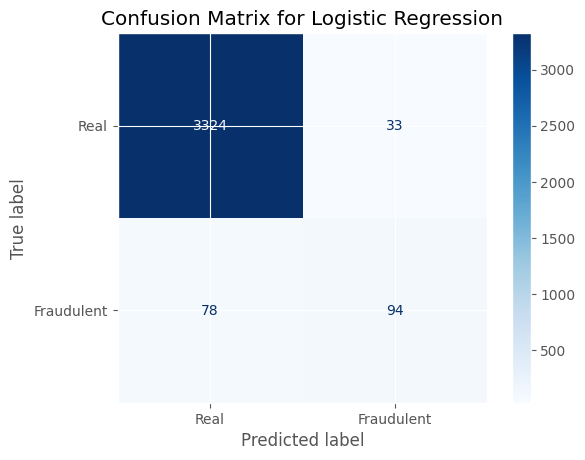

--------------------------------------------------
Model: Random Forest
Random Forest - F1 Score: 0.8826, ROC-AUC: 0.9839
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      3357
           1       0.98      0.64      0.77       172

    accuracy                           0.98      3529
   macro avg       0.98      0.82      0.88      3529
weighted avg       0.98      0.98      0.98      3529



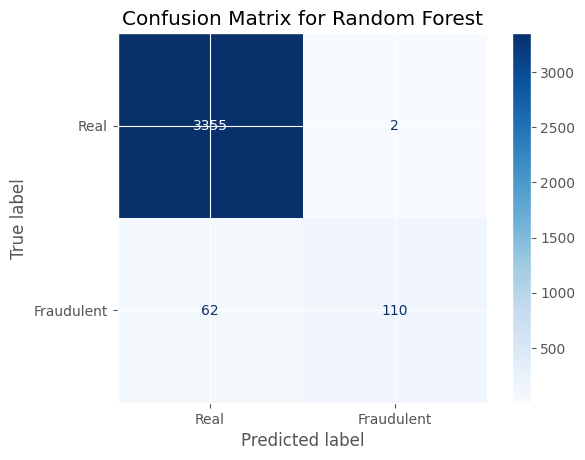

--------------------------------------------------
Model: SVC
SVC - F1 Score: 0.8850, ROC-AUC: 0.9605
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      3357
           1       0.93      0.67      0.78       172

    accuracy                           0.98      3529
   macro avg       0.96      0.83      0.89      3529
weighted avg       0.98      0.98      0.98      3529



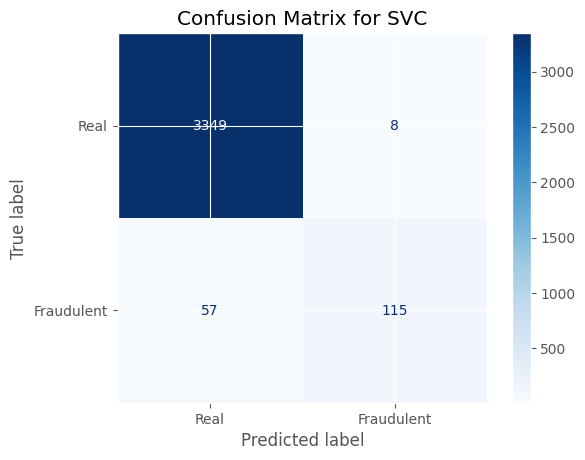

--------------------------------------------------
Model: Gradient Boosting
Gradient Boosting - F1 Score: 0.8487, ROC-AUC: 0.9709
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      3357
           1       0.86      0.60      0.71       172

    accuracy                           0.98      3529
   macro avg       0.92      0.80      0.85      3529
weighted avg       0.97      0.98      0.97      3529



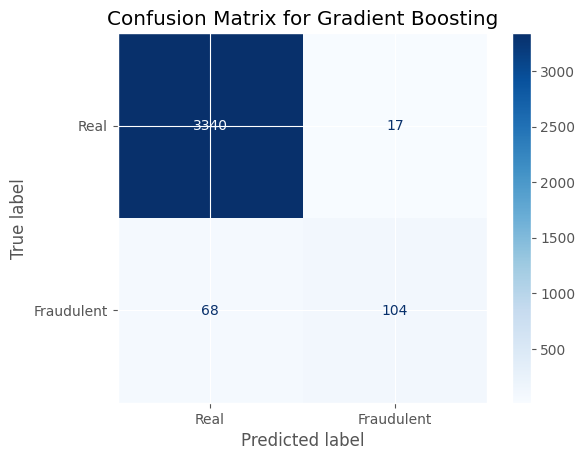

--------------------------------------------------
Model: XGBoost
XGBoost - F1 Score: 0.9015, ROC-AUC: 0.9852
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      3357
           1       0.92      0.73      0.81       172

    accuracy                           0.98      3529
   macro avg       0.95      0.86      0.90      3529
weighted avg       0.98      0.98      0.98      3529



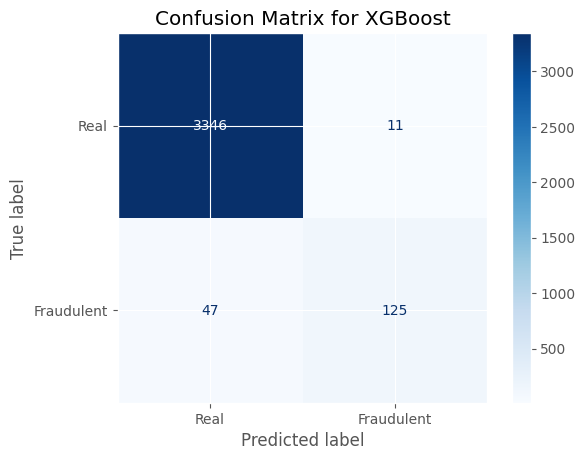

--------------------------------------------------
Model: LightGBM
LightGBM - F1 Score: 0.8921, ROC-AUC: 0.9881
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      3357
           1       0.93      0.69      0.79       172

    accuracy                           0.98      3529
   macro avg       0.96      0.84      0.89      3529
weighted avg       0.98      0.98      0.98      3529



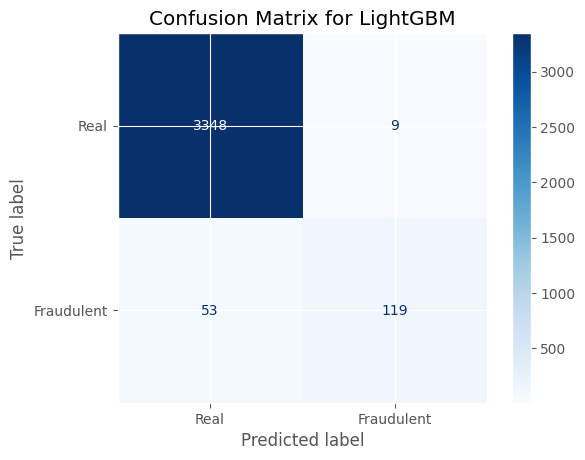

--------------------------------------------------


,Model,F1 Score,ROC-AUC
4,XGBoost,0.901548,0.985161
5,LightGBM,0.892080,0.988074
2,SVC,0.885025,0.960535
1,Random Forest,0.882600,0.983944
3,Gradient Boosting,0.848666,0.970885
0,Logistic Regression,0.806170,0.963270


In [24]:
def modelling(models, X_train, y_train, X_test, y_test):
    results = []
    for name, model in models:
        print(f"Model: {name}")
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        y_proba = model.predict_proba(X_test)[:, 1]
        recall = recall_score(y_test, y_pred)
        roc_auc = roc_auc_score(y_test, y_proba)
        f1 = f1_score(y_test, y_pred, average='macro')
        print(f"{name} - F1 Score: {f1:.4f}, ROC-AUC: {roc_auc:.4f}")
        results.append((name, f1, roc_auc))
        print(classification_report(y_test, y_pred))
        cm = confusion_matrix(y_test, y_pred)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Real", "Fraudulent"])
        disp.plot(cmap='Blues')
        plt.title(f'Confusion Matrix for {name}')
        plt.show()
        print("-"*50)
    results_df = pd.DataFrame(results, columns=['Model', 'F1 Score', 'ROC-AUC'])
    return results_df.sort_values(by='F1 Score', ascending=False)
results_df = modelling(models_no_weight, X_train_emb, y_train, X_test_emb, y_test)
results_df

In [17]:
weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)
class_weights = {i: weight for i, weight in enumerate(weights)}
class_weights

{0: np.float64(0.5255398361876397), 1: np.float64(10.28862973760933)}

Model: Logistic Regression
Logistic Regression - F1 Score: 0.7365, ROC-AUC: 0.9706
              precision    recall  f1-score   support

           0       1.00      0.91      0.95      3357
           1       0.36      0.94      0.52       172

    accuracy                           0.92      3529
   macro avg       0.68      0.93      0.74      3529
weighted avg       0.97      0.92      0.93      3529



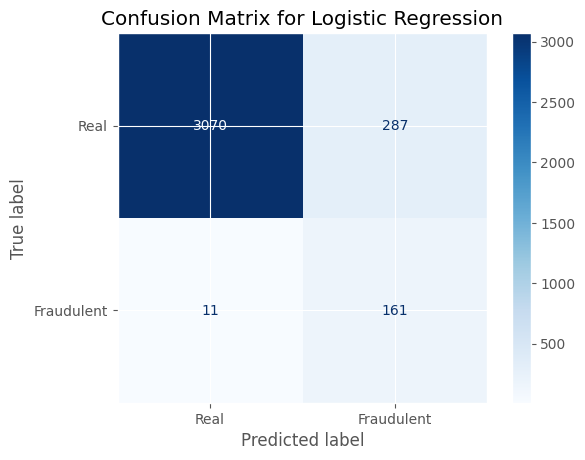

--------------------------------------------------
Model: Random Forest
Random Forest - F1 Score: 0.8713, ROC-AUC: 0.9834
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      3357
           1       0.98      0.61      0.75       172

    accuracy                           0.98      3529
   macro avg       0.98      0.80      0.87      3529
weighted avg       0.98      0.98      0.98      3529



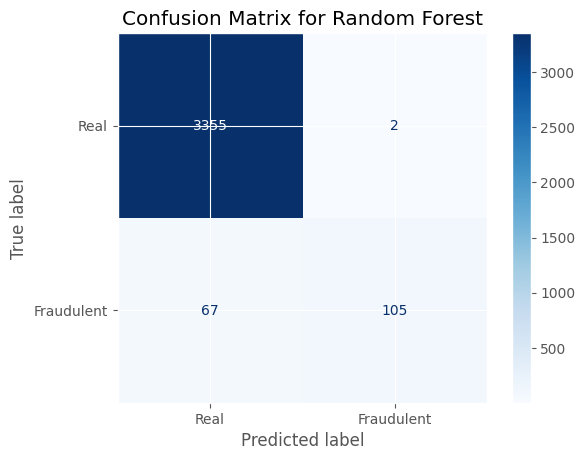

--------------------------------------------------
Model: SVC
SVC - F1 Score: 0.8826, ROC-AUC: 0.9848
              precision    recall  f1-score   support

           0       0.99      0.98      0.99      3357
           1       0.71      0.85      0.78       172

    accuracy                           0.98      3529
   macro avg       0.85      0.92      0.88      3529
weighted avg       0.98      0.98      0.98      3529



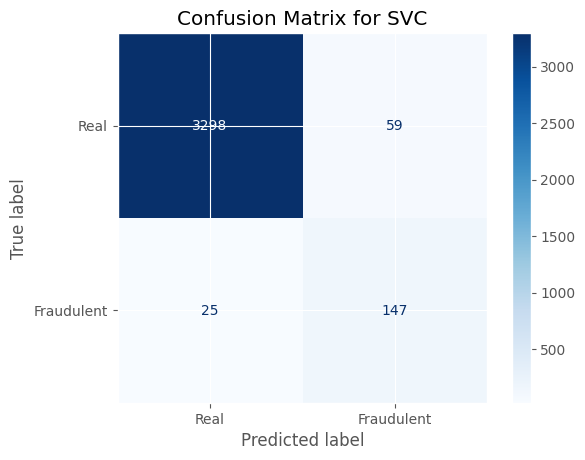

--------------------------------------------------
Model: XGBoost
XGBoost - F1 Score: 0.8953, ROC-AUC: 0.9880
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      3357
           1       0.86      0.74      0.80       172

    accuracy                           0.98      3529
   macro avg       0.93      0.87      0.90      3529
weighted avg       0.98      0.98      0.98      3529



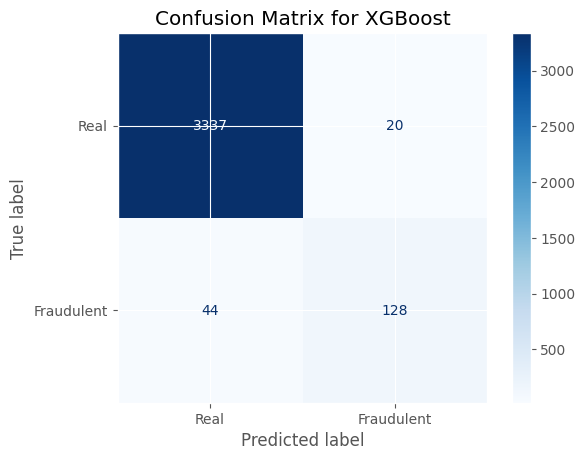

--------------------------------------------------
Model: LightGBM
LightGBM - F1 Score: 0.9060, ROC-AUC: 0.9875
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      3357
           1       0.86      0.78      0.82       172

    accuracy                           0.98      3529
   macro avg       0.92      0.89      0.91      3529
weighted avg       0.98      0.98      0.98      3529



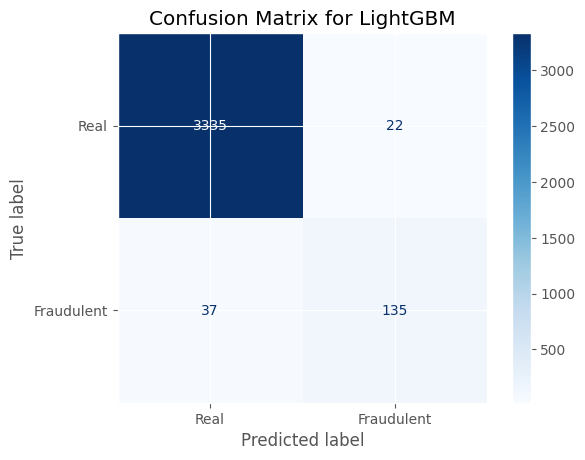

--------------------------------------------------


,Model,F1 Score,ROC-AUC
4,LightGBM,0.905950,0.987487
3,XGBoost,0.895251,0.987995
2,SVC,0.882601,0.984786
1,Random Forest,0.871255,0.983428
0,Logistic Regression,0.736534,0.970577


In [26]:
models_with_weight = [
    ('Logistic Regression', LogisticRegression(max_iter=1000, random_state=SEED, class_weight=class_weights)),
    ('Random Forest', RandomForestClassifier(n_estimators=100, random_state=SEED, class_weight=class_weights)),
    ('SVC', SVC(probability=True, random_state=SEED, class_weight=class_weights)),
    # ('Gradient Boosting', GradientBoostingClassifier(n_estimators=100, random_state=SEED)),
    ('XGBoost', XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=SEED, scale_pos_weight = len(y_train[y_train==0]) / len(y_train[y_train==1]))),
    ('LightGBM', LGBMClassifier(random_state=SEED, verbose=-1, class_weight=class_weights)),
]

results_df_weight = modelling(models_with_weight, X_train_emb, y_train, X_test_emb, y_test)
results_df_weight

In [42]:
one_hot = OneHotEncoder(sparse_output=False, handle_unknown='ignore', drop='first')
cat_data_train = one_hot.fit_transform(X_train[cat_cols])
cat_data_test = one_hot.transform(X_test[cat_cols])
cat_data_train.shape, cat_data_test.shape

((14116, 116), (3529, 116))

In [43]:
with open('../artifacts/encoder.pkl', 'wb') as f:
    pickle.dump(one_hot, f)

Model: Logistic Regression
Logistic Regression - F1 Score: 0.5421, ROC-AUC: 0.8283
              precision    recall  f1-score   support

           0       0.95      1.00      0.98      3357
           1       0.77      0.06      0.11       172

    accuracy                           0.95      3529
   macro avg       0.86      0.53      0.54      3529
weighted avg       0.94      0.95      0.93      3529



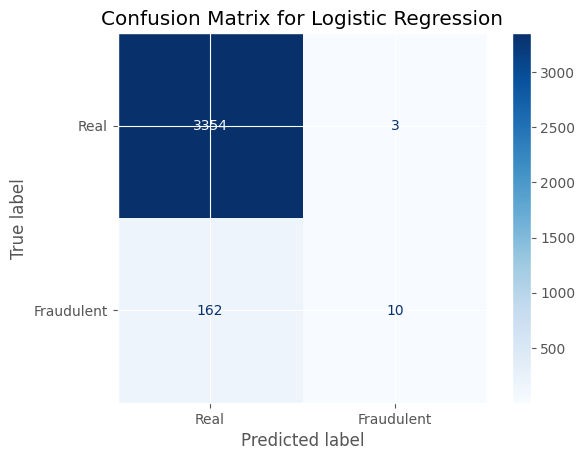

--------------------------------------------------
Model: Random Forest
Random Forest - F1 Score: 0.6913, ROC-AUC: 0.8745
              precision    recall  f1-score   support

           0       0.96      0.99      0.98      3357
           1       0.73      0.28      0.40       172

    accuracy                           0.96      3529
   macro avg       0.85      0.64      0.69      3529
weighted avg       0.95      0.96      0.95      3529



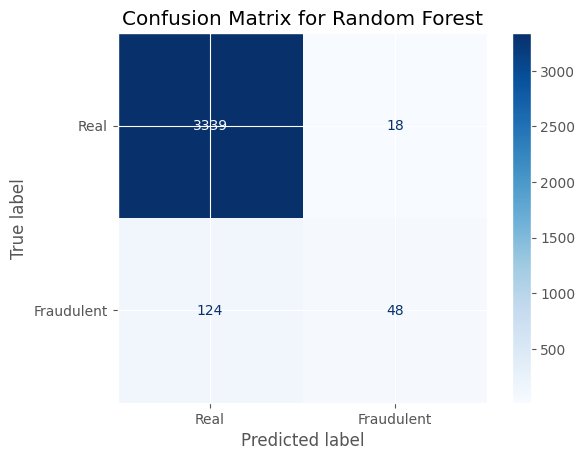

--------------------------------------------------
Model: SVC
SVC - F1 Score: 0.6382, ROC-AUC: 0.8477
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      3357
           1       1.00      0.17      0.30       172

    accuracy                           0.96      3529
   macro avg       0.98      0.59      0.64      3529
weighted avg       0.96      0.96      0.95      3529



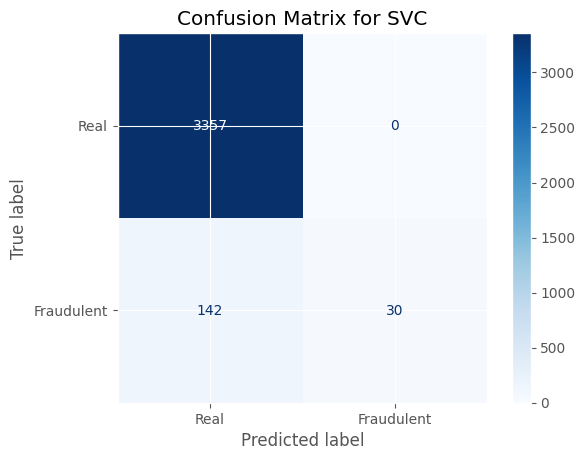

--------------------------------------------------
Model: Gradient Boosting
Gradient Boosting - F1 Score: 0.6057, ROC-AUC: 0.8497
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      3357
           1       0.92      0.13      0.23       172

    accuracy                           0.96      3529
   macro avg       0.94      0.57      0.61      3529
weighted avg       0.96      0.96      0.94      3529



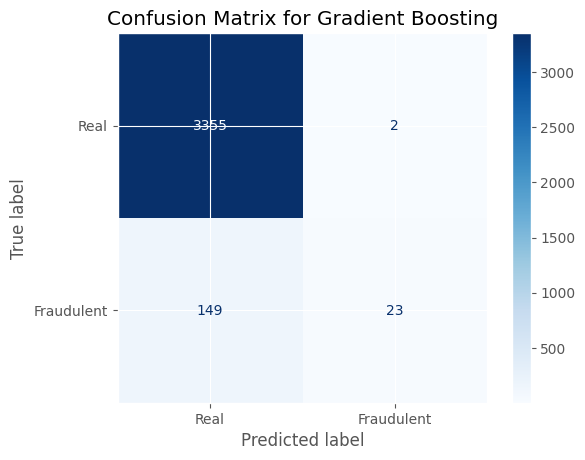

--------------------------------------------------
Model: XGBoost
XGBoost - F1 Score: 0.6957, ROC-AUC: 0.8790
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      3357
           1       0.88      0.27      0.41       172

    accuracy                           0.96      3529
   macro avg       0.92      0.63      0.70      3529
weighted avg       0.96      0.96      0.95      3529



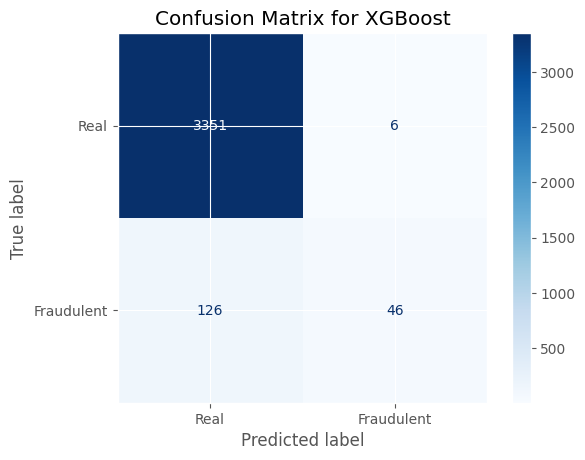

--------------------------------------------------
Model: LightGBM
LightGBM - F1 Score: 0.6837, ROC-AUC: 0.8727
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      3357
           1       0.80      0.26      0.39       172

    accuracy                           0.96      3529
   macro avg       0.88      0.63      0.68      3529
weighted avg       0.96      0.96      0.95      3529



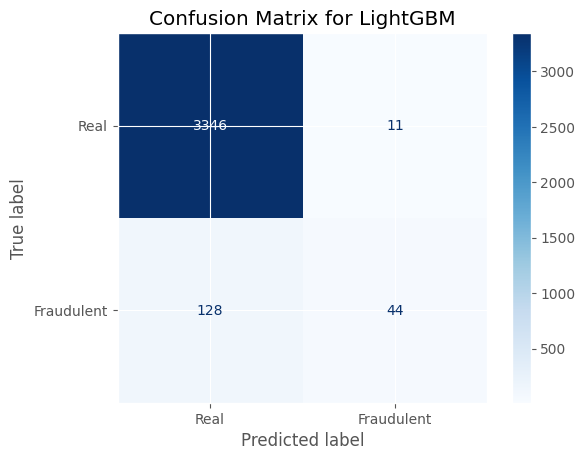

--------------------------------------------------


,Model,F1 Score,ROC-AUC
4,XGBoost,0.695700,0.878996
1,Random Forest,0.691270,0.874451
5,LightGBM,0.683658,0.872748
2,SVC,0.638159,0.847680
3,Gradient Boosting,0.605747,0.849662
0,Logistic Regression,0.542051,0.828275


In [28]:
modelling(models_no_weight, cat_data_train, y_train, cat_data_test, y_test)

Model: Logistic Regression
Logistic Regression - F1 Score: 0.4980, ROC-AUC: 0.8285
              precision    recall  f1-score   support

           0       0.99      0.66      0.79      3357
           1       0.11      0.85      0.20       172

    accuracy                           0.67      3529
   macro avg       0.55      0.76      0.50      3529
weighted avg       0.95      0.67      0.77      3529



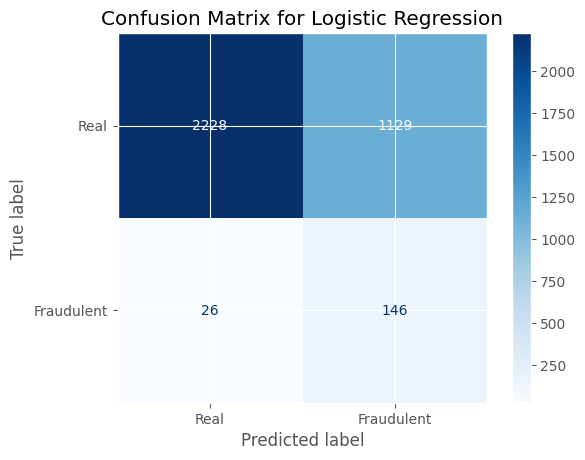

--------------------------------------------------
Model: Random Forest
Random Forest - F1 Score: 0.5738, ROC-AUC: 0.8641
              precision    recall  f1-score   support

           0       0.99      0.79      0.88      3357
           1       0.16      0.78      0.27       172

    accuracy                           0.79      3529
   macro avg       0.57      0.79      0.57      3529
weighted avg       0.95      0.79      0.85      3529



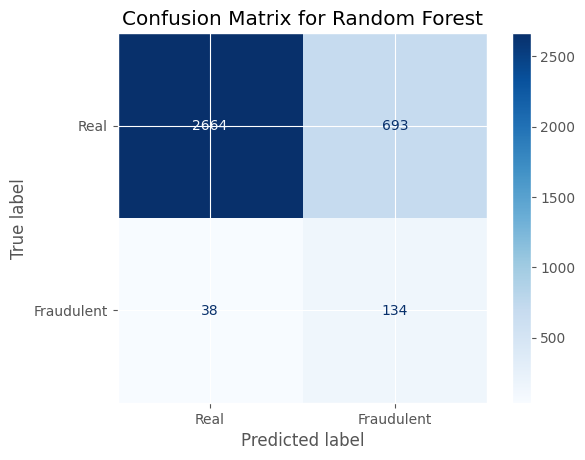

--------------------------------------------------
Model: SVC
SVC - F1 Score: 0.5610, ROC-AUC: 0.8575
              precision    recall  f1-score   support

           0       0.99      0.77      0.86      3357
           1       0.15      0.83      0.26       172

    accuracy                           0.77      3529
   macro avg       0.57      0.80      0.56      3529
weighted avg       0.95      0.77      0.83      3529



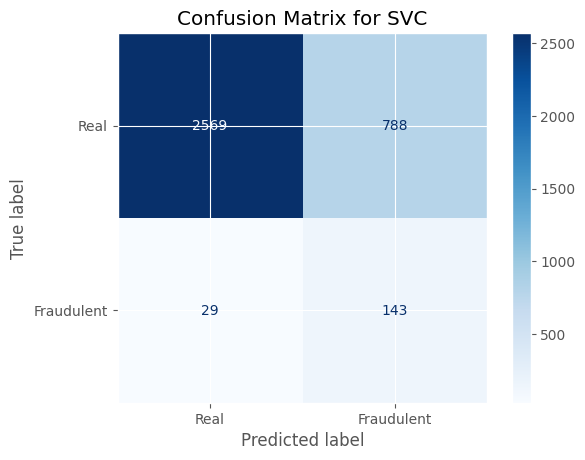

--------------------------------------------------
Model: Gradient Boosting
Gradient Boosting - F1 Score: 0.6057, ROC-AUC: 0.8497
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      3357
           1       0.92      0.13      0.23       172

    accuracy                           0.96      3529
   macro avg       0.94      0.57      0.61      3529
weighted avg       0.96      0.96      0.94      3529



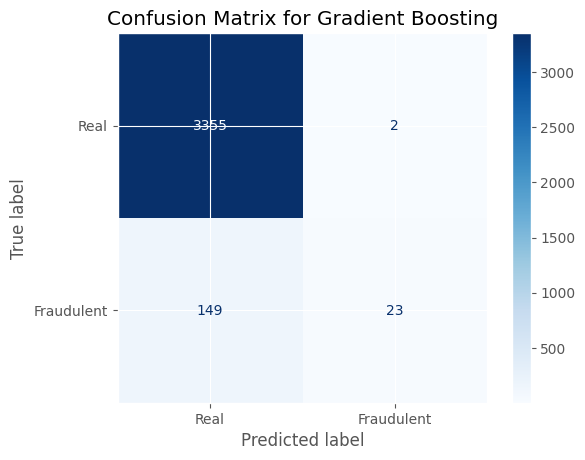

--------------------------------------------------
Model: XGBoost
XGBoost - F1 Score: 0.5606, ROC-AUC: 0.8759
              precision    recall  f1-score   support

           0       0.99      0.77      0.86      3357
           1       0.15      0.81      0.26       172

    accuracy                           0.77      3529
   macro avg       0.57      0.79      0.56      3529
weighted avg       0.95      0.77      0.83      3529



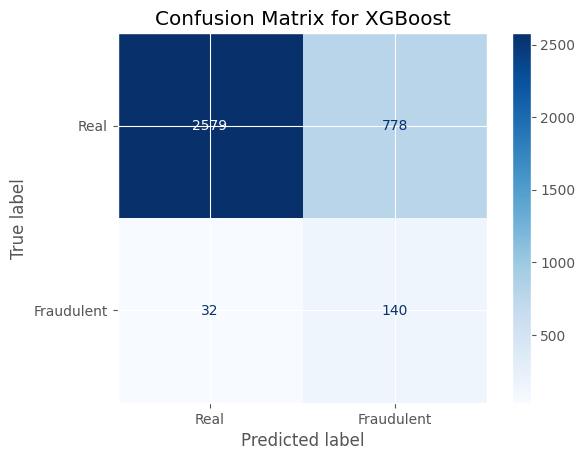

--------------------------------------------------
Model: LightGBM
LightGBM - F1 Score: 0.5520, ROC-AUC: 0.8715
              precision    recall  f1-score   support

           0       0.99      0.75      0.85      3357
           1       0.15      0.83      0.25       172

    accuracy                           0.76      3529
   macro avg       0.57      0.79      0.55      3529
weighted avg       0.95      0.76      0.83      3529



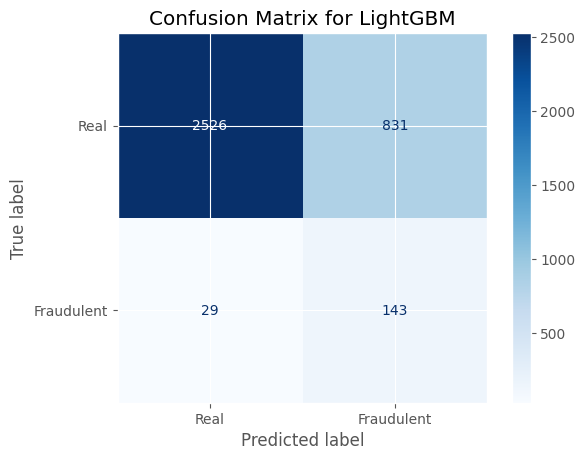

--------------------------------------------------


,Model,F1 Score,ROC-AUC
3,Gradient Boosting,0.605747,0.849662
1,Random Forest,0.573811,0.864068
2,SVC,0.561049,0.857498
4,XGBoost,0.560578,0.875920
5,LightGBM,0.552048,0.871500
0,Logistic Regression,0.497976,0.828514


In [120]:
modelling(models_with_weight, cat_data_train, y_train, cat_data_test, y_test)   

In [29]:
X_train_emb.shape

(14116, 768)

In [30]:
X_train_stack = np.hstack((X_train_emb, cat_data_train))
X_test_stack = np.hstack((X_test_emb, cat_data_test))
X_train_stack.shape, X_test_stack.shape

((14116, 884), (3529, 884))

In [31]:
scaler_stack = StandardScaler()
X_train_stack = scaler_stack.fit_transform(X_train_stack)
X_test_stack = scaler_stack.transform(X_test_stack)

# with open('../artifacts/scaler_stack.pkl', 'wb') as f:
#     pickle.dump(scaler_stack, f)

In [32]:
X_train_stack.shape, X_test_stack.shape

((14116, 884), (3529, 884))

In [75]:
model = LGBMClassifier(verbose=-1)
model.fit(X_train_stack, y_train)
y_pred = model.predict(X_test_stack)
y_pred

array([0, 0, 0, ..., 0, 0, 0])

Model: Logistic Regression
Logistic Regression - F1 Score: 0.8767, ROC-AUC: 0.9746
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      3357
           1       0.75      0.78      0.77       172

    accuracy                           0.98      3529
   macro avg       0.87      0.88      0.88      3529
weighted avg       0.98      0.98      0.98      3529



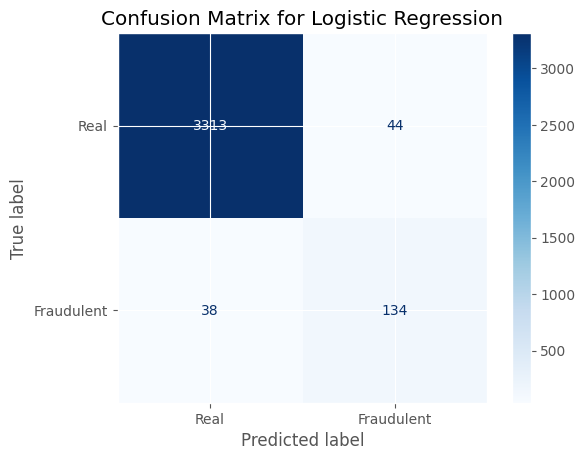

--------------------------------------------------
Model: Random Forest
Random Forest - F1 Score: 0.8840, ROC-AUC: 0.9843
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      3357
           1       0.99      0.64      0.78       172

    accuracy                           0.98      3529
   macro avg       0.99      0.82      0.88      3529
weighted avg       0.98      0.98      0.98      3529



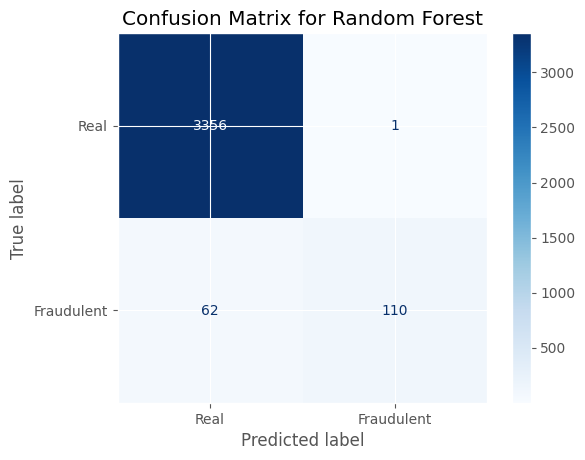

--------------------------------------------------
Model: SVC
SVC - F1 Score: 0.8969, ROC-AUC: 0.9721
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      3357
           1       0.92      0.71      0.80       172

    accuracy                           0.98      3529
   macro avg       0.95      0.85      0.90      3529
weighted avg       0.98      0.98      0.98      3529



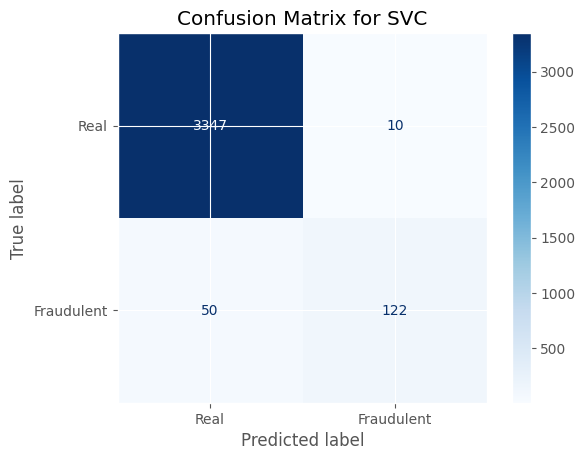

--------------------------------------------------
Model: Gradient Boosting
Gradient Boosting - F1 Score: 0.8558, ROC-AUC: 0.9746
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      3357
           1       0.88      0.62      0.72       172

    accuracy                           0.98      3529
   macro avg       0.93      0.81      0.86      3529
weighted avg       0.98      0.98      0.98      3529



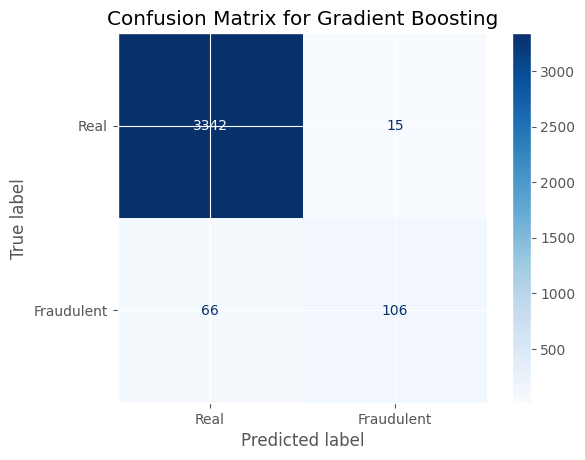

--------------------------------------------------
Model: XGBoost
XGBoost - F1 Score: 0.8975, ROC-AUC: 0.9890
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      3357
           1       0.92      0.72      0.80       172

    accuracy                           0.98      3529
   macro avg       0.95      0.86      0.90      3529
weighted avg       0.98      0.98      0.98      3529



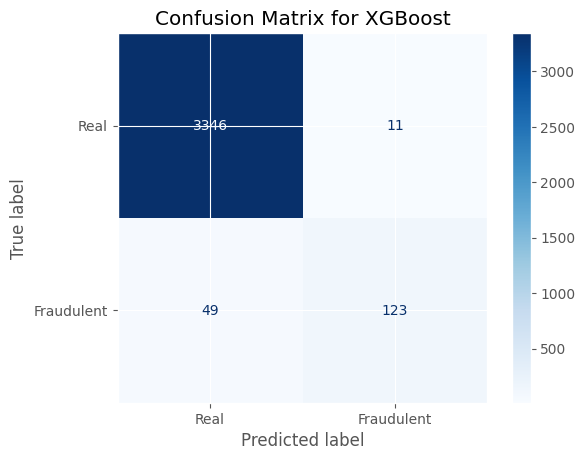

--------------------------------------------------
Model: LightGBM
LightGBM - F1 Score: 0.8956, ROC-AUC: 0.9898
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      3357
           1       0.94      0.70      0.80       172

    accuracy                           0.98      3529
   macro avg       0.96      0.85      0.90      3529
weighted avg       0.98      0.98      0.98      3529



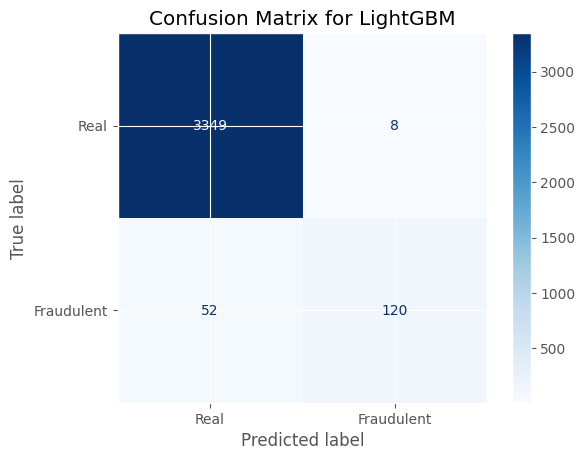

--------------------------------------------------


,Model,F1 Score,ROC-AUC
4,XGBoost,0.897518,0.988978
2,SVC,0.896874,0.972080
5,LightGBM,0.895561,0.989761
1,Random Forest,0.884043,0.984269
0,Logistic Regression,0.876745,0.974638
3,Gradient Boosting,0.855788,0.974605


In [33]:
modelling(models_no_weight, X_train_stack, y_train, X_test_stack, y_test)

Model: Logistic Regression
Logistic Regression - F1 Score: 0.8418, ROC-AUC: 0.9731
              precision    recall  f1-score   support

           0       0.99      0.97      0.98      3357
           1       0.60      0.84      0.70       172

    accuracy                           0.97      3529
   macro avg       0.80      0.91      0.84      3529
weighted avg       0.97      0.97      0.97      3529



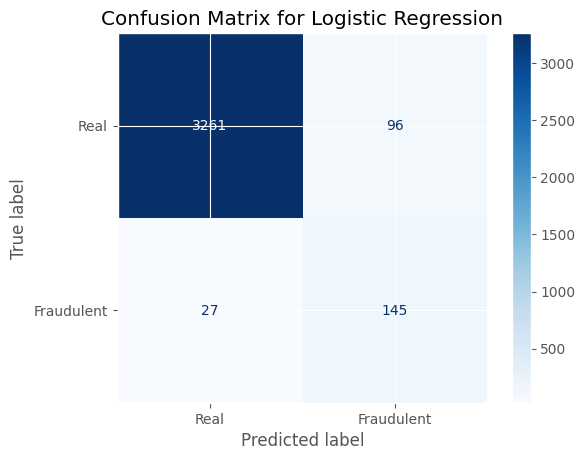

--------------------------------------------------
Model: Random Forest
Random Forest - F1 Score: 0.8795, ROC-AUC: 0.9849
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      3357
           1       0.99      0.63      0.77       172

    accuracy                           0.98      3529
   macro avg       0.99      0.81      0.88      3529
weighted avg       0.98      0.98      0.98      3529



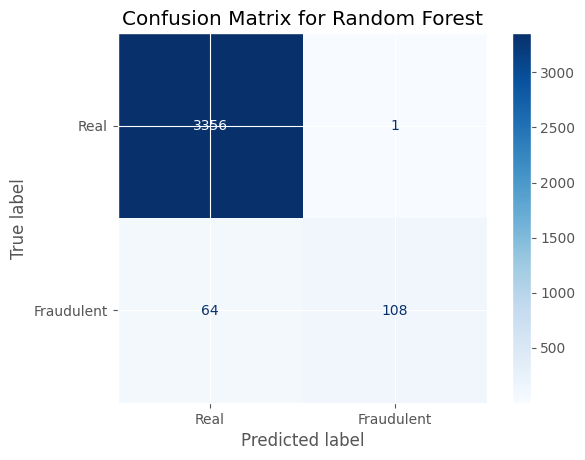

--------------------------------------------------
Model: SVC
SVC - F1 Score: 0.9179, ROC-AUC: 0.9869
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      3357
           1       0.84      0.85      0.84       172

    accuracy                           0.98      3529
   macro avg       0.92      0.92      0.92      3529
weighted avg       0.98      0.98      0.98      3529



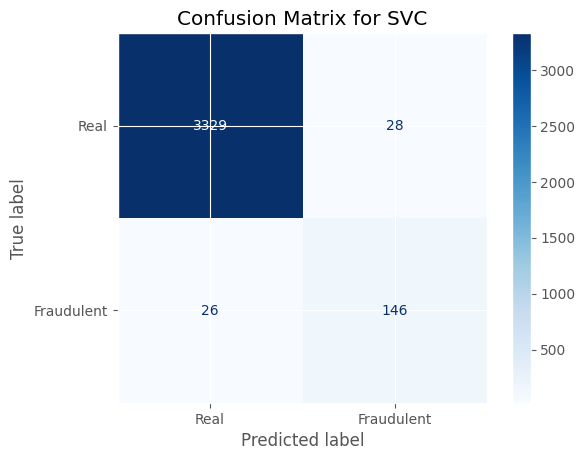

--------------------------------------------------
Model: XGBoost
XGBoost - F1 Score: 0.9116, ROC-AUC: 0.9873
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      3357
           1       0.90      0.77      0.83       172

    accuracy                           0.98      3529
   macro avg       0.94      0.88      0.91      3529
weighted avg       0.98      0.98      0.98      3529



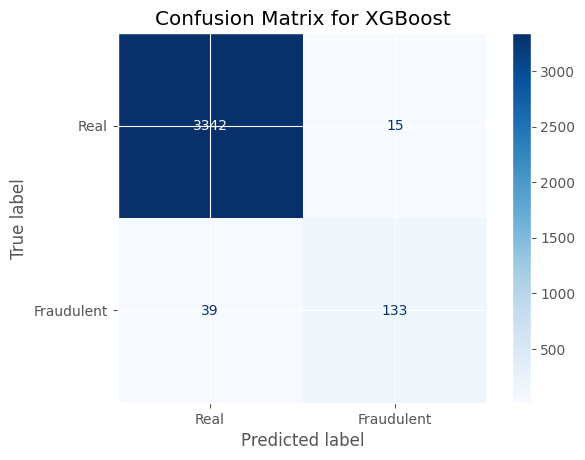

--------------------------------------------------
Model: LightGBM
LightGBM - F1 Score: 0.9183, ROC-AUC: 0.9876
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      3357
           1       0.87      0.82      0.84       172

    accuracy                           0.99      3529
   macro avg       0.93      0.91      0.92      3529
weighted avg       0.98      0.99      0.99      3529



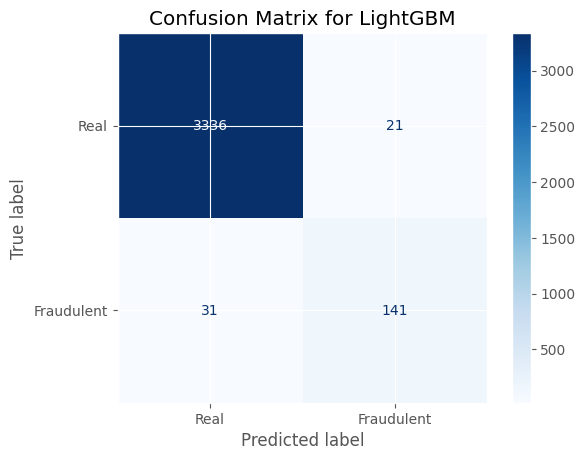

--------------------------------------------------


,Model,F1 Score,ROC-AUC
4,LightGBM,0.918289,0.987551
2,SVC,0.917943,0.986928
3,XGBoost,0.911618,0.987336
1,Random Forest,0.879546,0.984937
0,Logistic Regression,0.841835,0.973060


In [34]:
modelling(models_with_weight, X_train_stack, y_train, X_test_stack, y_test)

In [26]:
X_train

,title,location,department,salary_range,company_profile,description,requirements,benefits,telecommuting,has_company_logo,has_questions,employment_type,required_experience,required_education,industry,function,in_balanced_dataset
5853,Community Manager,"US, CA, San Diego",NaN,NaN,<p>Cashie Commerce is the fastest way to creat...,<p>The Cashie Commerce team is looking for a C...,"<p>To perform this job successfully, an indivi...",<p>Cashie Commerce offers a competitive salary...,0,1,1,Full-time,Entry level,NaN,Internet,Customer Service,0
13334,Marketing or Journalism Major turned Project M...,"US, IN, Fishers",App Delivery,30000-30000,<p>Bluebridge was created by a team of people ...,<p>Bluebridge is an app development company - ...,"<p>This could be the job for you, if you enjoy...",NaN,0,1,1,Full-time,Entry level,Associate Degree,Marketing and Advertising,Project Management,0
13937,English Teacher Abroad,"US, MS, Oxford",NaN,NaN,<p>We help teachers get safe &amp; secure jobs...,"<p>Play with kids, get paid for it </p>\r\n<p>...",<p>University degree required. TEFL / TESOL / ...,<p>See job description</p>,0,1,1,Contract,NaN,Bachelor's Degree,Education Management,NaN,0
3068,Sales Professional - Web and SaaS Sales,"US, CA, San Diego",NaN,NaN,<p>PINT is a leader in the web industry with 2...,"<p>PINT is seeking a motivated, knowledgeable ...",<p>Suitable candidates will possess the follow...,"<p>PINT offers industry-competitive salaries, ...",0,1,1,Full-time,Associate,Bachelor's Degree,Internet,Sales,0
7086,"OR/Materials Manager (Hospital Near Casper, WY)","US, WY, Casper",NaN,NaN,NaN,<p><i><b>Dynamic position for Nurse leader OR ...,<p>Good clinical skills (will sometimes work i...,<p>Competitive Salary &amp; benefits</p>,0,0,0,Full-time,Mid-Senior level,Bachelor's Degree,Hospital & Health Care,Health Care Provider,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1576,Business Cash Advance Sales - $100K +++ Earnin...,"US, NY, Middletown",NaN,NaN,<p><b>About Fundzio</b></p>\r\n<p> </p>\r\n<p>...,<p>Job description - Sales Marketing Agents WA...,NaN,NaN,0,1,0,Contract,Entry level,High School or equivalent,Financial Services,Sales,0
2951,Executive Assistant,"US, VA, Tysons Corner",NaN,NaN,"<p>For more than two decades, the TRAK Compani...","<p>Our client, an exceptional investment bank ...",<ul>\r\n<li>5+ years experience in an Executiv...,NaN,0,1,1,NaN,NaN,NaN,NaN,NaN,0
8003,Assistant Project Manager,"FR, J, Paris",NaN,NaN,<p><b>EUROPEAN DYNAMICS (#URL_c66532ffa1ce76ab...,<p>We currently have a vacancy for an <b>Assis...,<p><b>Your skills:</b></p>\r\n<ul>\r\n<li>Univ...,<p><b>Our offer: </b></p>\r\n<p>If you are see...,0,1,0,Full-time,Associate,Associate Degree,Computer Software,Information Technology,0
12213,Sr Software Engineer,"US, MD, Rockville",NaN,NaN,NaN,<p>Cobb Systems Group is seeking a talented Sr...,<p></p>\r\n<p>5+ years of .Net development</p>...,NaN,0,1,0,Contract,NaN,Bachelor's Degree,Computer Software,NaN,0


In [44]:
def add_features(X):
    X_feat = X.copy()
    X_feat['full_text_raw'] = X_feat['company_profile'] + ' - ' + X_feat['description'] + ' - ' + X_feat['requirements'] + ' - ' + X_feat['benefits']
    X_feat['word_count'] = X_feat['full_text_raw'].apply(lambda x: len(word_tokenize(x)))
    X_feat['sentence_count'] = X_feat['full_text_raw'].apply(lambda x: len(sent_tokenize(x)))
    X_feat['total_emojis'] = X_feat['full_text_raw'].apply(lambda x: len(emoji_pattern.findall(x)))
    X_feat['sentiment_polarity'] = X_feat['full_text_raw'].apply(lambda x: TextBlob(x).sentiment.polarity)
    X_feat['sentiment_subjectivity'] = X_feat['full_text_raw'].apply(lambda x: TextBlob(x).sentiment.subjectivity)
    punc_count = lambda x: len([char for char in x if char in string.punctuation])
    X_feat['punc_ratio'] = X_feat['full_text_raw'].apply(lambda x: punc_count(x)) / X_feat['word_count'].replace(0, 1)
    X_feat['lexical_diversity'] = X_feat['full_text_raw'].apply(lambda x: len(set(word_tokenize(x)))) / X_feat['word_count'].replace(0, 1)
    X_feat['number_ratio'] = X_feat['full_text_raw'].apply(lambda x: len(re.findall(r'\d+', x))) / X_feat['word_count'].replace(0, 1)
    new_cols = ['word_count', 'sentence_count', 'total_emojis', 'sentiment_polarity', 'sentiment_subjectivity', 'punc_ratio', 'lexical_diversity', 'number_ratio']
    return X_feat[new_cols]

X_train_feat = add_features(X_train)
X_test_feat = add_features(X_test)
X_train_feat.shape, X_test_feat.shape

((14116, 8), (3529, 8))

In [37]:
scaler_feat = StandardScaler()
X_train_feat_scaled = scaler_feat.fit_transform(X_train_feat)
X_test_feat_scaled = scaler_feat.transform(X_test_feat)

Model: Logistic Regression
Logistic Regression - F1 Score: 0.5047, ROC-AUC: 0.6601
              precision    recall  f1-score   support

           0       0.95      1.00      0.98      3357
           1       0.75      0.02      0.03       172

    accuracy                           0.95      3529
   macro avg       0.85      0.51      0.50      3529
weighted avg       0.94      0.95      0.93      3529



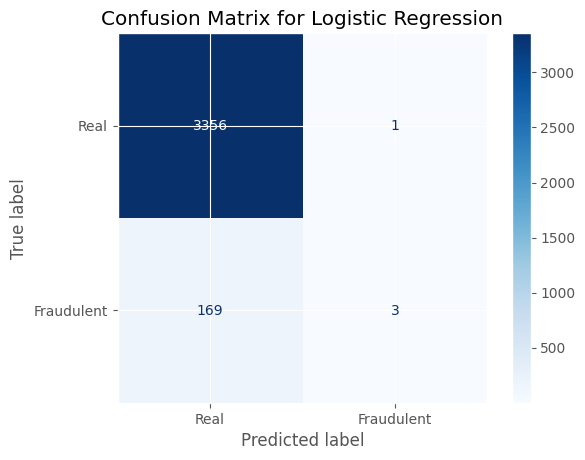

--------------------------------------------------
Model: Random Forest
Random Forest - F1 Score: 0.7608, ROC-AUC: 0.8932
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      3357
           1       0.97      0.37      0.54       172

    accuracy                           0.97      3529
   macro avg       0.97      0.69      0.76      3529
weighted avg       0.97      0.97      0.96      3529



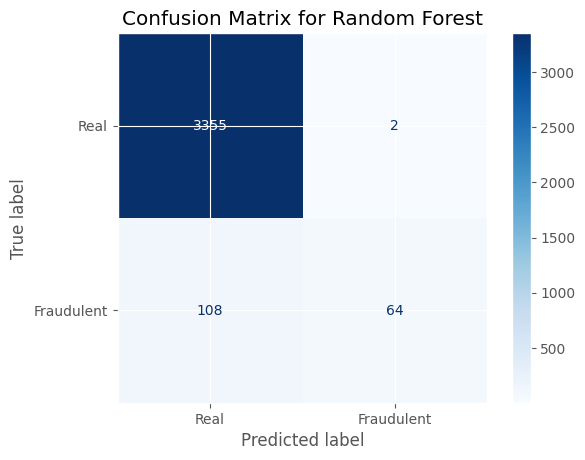

--------------------------------------------------
Model: SVC
SVC - F1 Score: 0.4990, ROC-AUC: 0.7358
              precision    recall  f1-score   support

           0       0.95      1.00      0.98      3357
           1       0.67      0.01      0.02       172

    accuracy                           0.95      3529
   macro avg       0.81      0.51      0.50      3529
weighted avg       0.94      0.95      0.93      3529



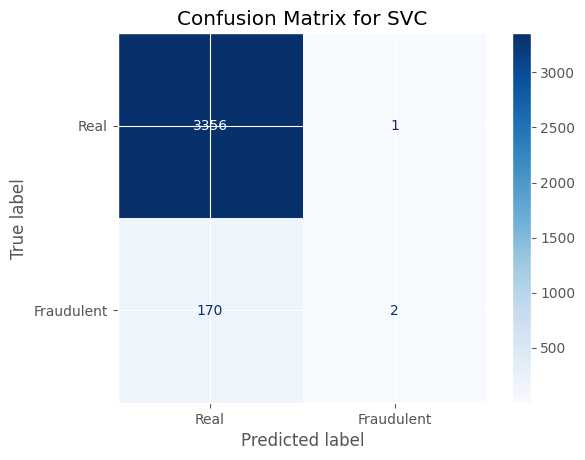

--------------------------------------------------
Model: Gradient Boosting
Gradient Boosting - F1 Score: 0.6596, ROC-AUC: 0.8469
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      3357
           1       0.90      0.21      0.34       172

    accuracy                           0.96      3529
   macro avg       0.93      0.60      0.66      3529
weighted avg       0.96      0.96      0.95      3529



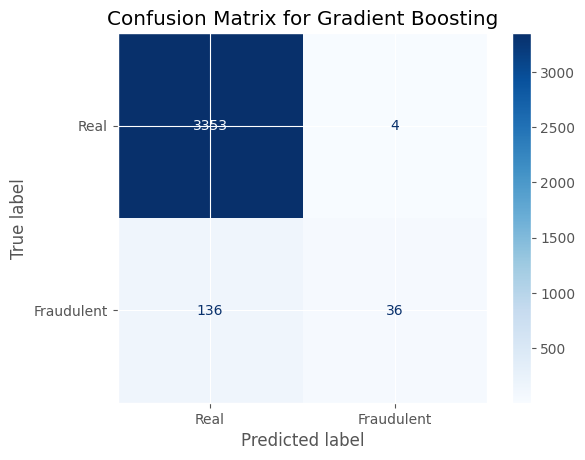

--------------------------------------------------
Model: XGBoost
XGBoost - F1 Score: 0.7345, ROC-AUC: 0.8685
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      3357
           1       0.76      0.36      0.49       172

    accuracy                           0.96      3529
   macro avg       0.86      0.68      0.73      3529
weighted avg       0.96      0.96      0.96      3529



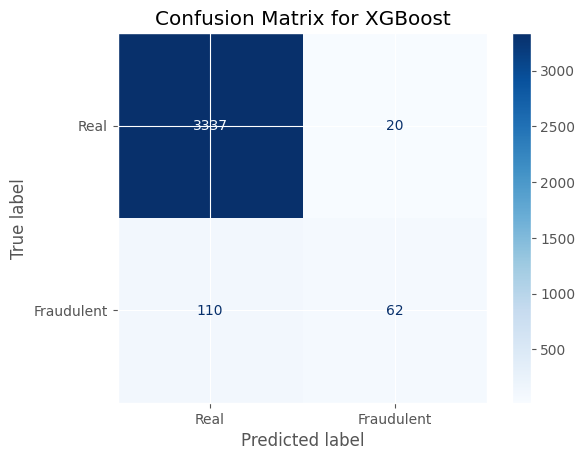

--------------------------------------------------
Model: LightGBM
LightGBM - F1 Score: 0.7228, ROC-AUC: 0.8865
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      3357
           1       0.85      0.32      0.46       172

    accuracy                           0.96      3529
   macro avg       0.91      0.66      0.72      3529
weighted avg       0.96      0.96      0.96      3529



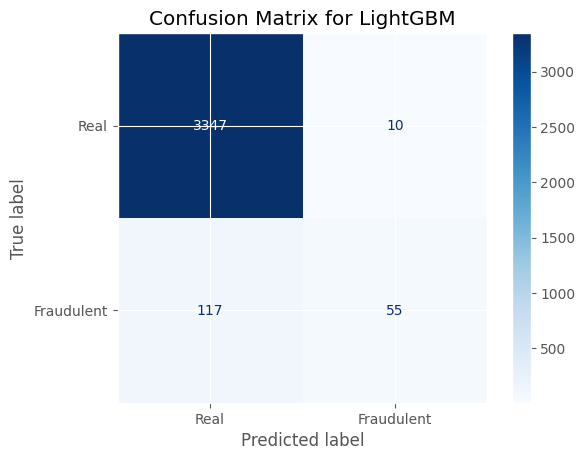

--------------------------------------------------


,Model,F1 Score,ROC-AUC
1,Random Forest,0.760843,0.893245
4,XGBoost,0.734541,0.868496
5,LightGBM,0.722758,0.886496
3,Gradient Boosting,0.659586,0.846882
0,Logistic Regression,0.504694,0.660054
2,SVC,0.499007,0.735750


In [38]:
modelling(models_no_weight, X_train_feat_scaled, y_train, X_test_feat_scaled, y_test)

Model: Logistic Regression
Logistic Regression - F1 Score: 0.4709, ROC-AUC: 0.6638
              precision    recall  f1-score   support

           0       0.97      0.68      0.80      3357
           1       0.08      0.56      0.14       172

    accuracy                           0.67      3529
   macro avg       0.52      0.62      0.47      3529
weighted avg       0.92      0.67      0.77      3529



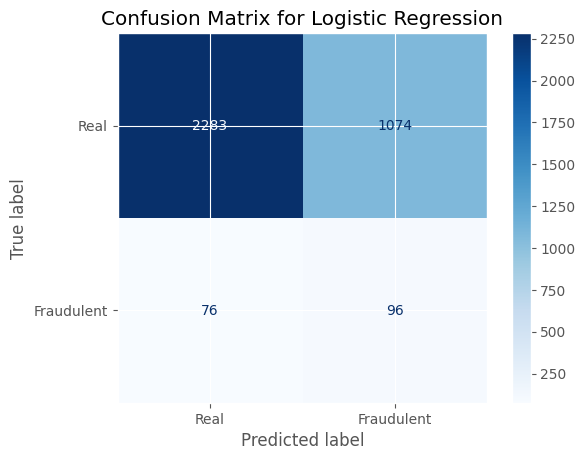

--------------------------------------------------
Model: Random Forest
Random Forest - F1 Score: 0.7471, ROC-AUC: 0.9012
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      3357
           1       1.00      0.34      0.51       172

    accuracy                           0.97      3529
   macro avg       0.98      0.67      0.75      3529
weighted avg       0.97      0.97      0.96      3529



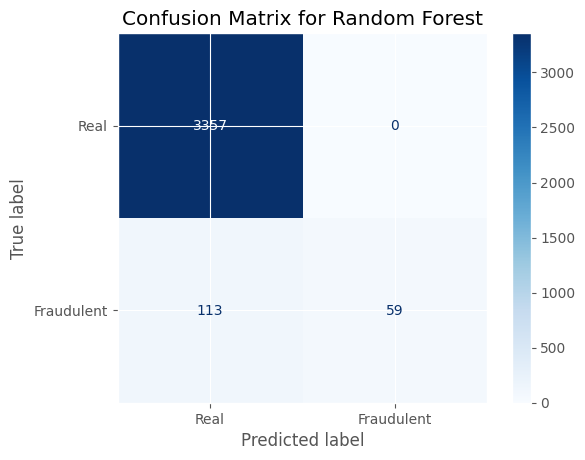

--------------------------------------------------
Model: SVC
SVC - F1 Score: 0.5447, ROC-AUC: 0.8086
              precision    recall  f1-score   support

           0       0.98      0.77      0.86      3357
           1       0.14      0.72      0.23       172

    accuracy                           0.76      3529
   macro avg       0.56      0.74      0.54      3529
weighted avg       0.94      0.76      0.83      3529



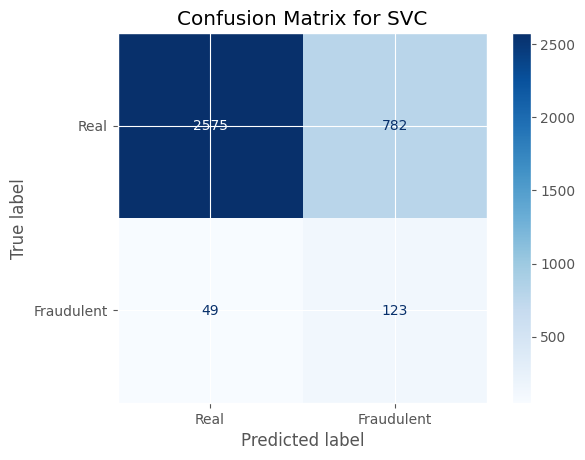

--------------------------------------------------
Model: Gradient Boosting
Gradient Boosting - F1 Score: 0.6596, ROC-AUC: 0.8465
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      3357
           1       0.90      0.21      0.34       172

    accuracy                           0.96      3529
   macro avg       0.93      0.60      0.66      3529
weighted avg       0.96      0.96      0.95      3529



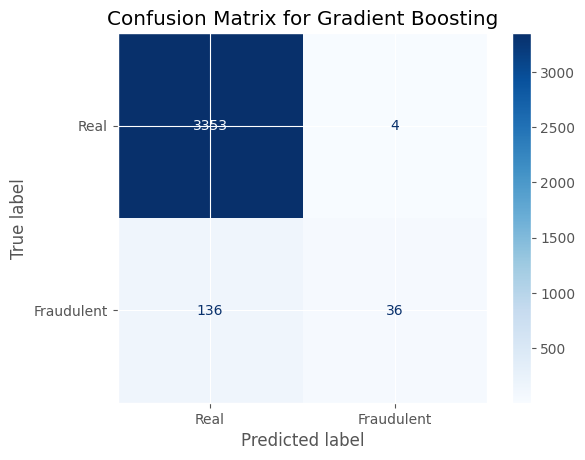

--------------------------------------------------
Model: XGBoost
XGBoost - F1 Score: 0.7538, ROC-AUC: 0.8647
              precision    recall  f1-score   support

           0       0.97      0.98      0.98      3357
           1       0.56      0.51      0.53       172

    accuracy                           0.96      3529
   macro avg       0.77      0.74      0.75      3529
weighted avg       0.95      0.96      0.96      3529



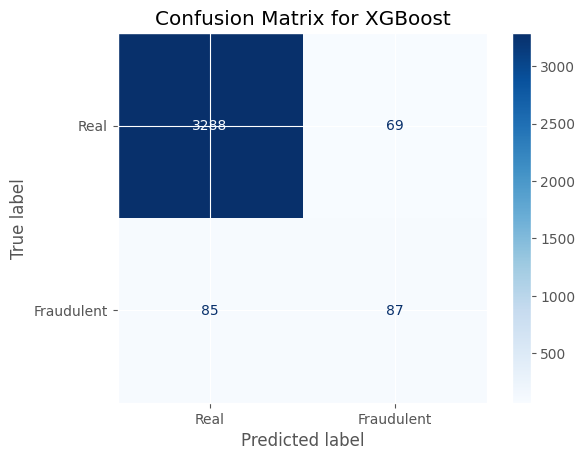

--------------------------------------------------
Model: LightGBM
LightGBM - F1 Score: 0.6693, ROC-AUC: 0.8711
              precision    recall  f1-score   support

           0       0.98      0.92      0.95      3357
           1       0.29      0.60      0.39       172

    accuracy                           0.91      3529
   macro avg       0.63      0.76      0.67      3529
weighted avg       0.94      0.91      0.92      3529



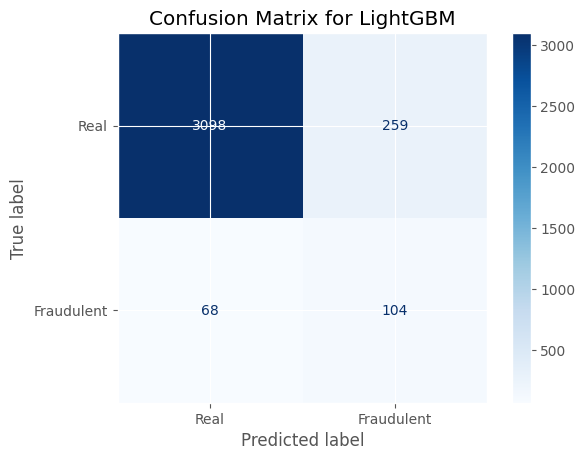

--------------------------------------------------


,Model,F1 Score,ROC-AUC
4,XGBoost,0.753803,0.864665
1,Random Forest,0.747135,0.901196
5,LightGBM,0.669327,0.871100
3,Gradient Boosting,0.659586,0.846528
2,SVC,0.544736,0.808647
0,Logistic Regression,0.470940,0.663780


In [129]:
modelling(models_with_weight, X_train_feat_scaled, y_train, X_test_feat_scaled, y_test)

In [45]:
X_train_final = np.hstack((X_train_emb, cat_data_train, X_train_feat.values))
X_test_final = np.hstack((X_test_emb, cat_data_test, X_test_feat.values))
X_train_final.shape, X_test_final.shape

((14116, 892), (3529, 892))

In [46]:
scaler_final = StandardScaler()
X_train_final = scaler_final.fit_transform(X_train_final)
X_test_final = scaler_final.transform(X_test_final)
with open('../artifacts/scaler_final.pkl', 'wb') as f:
    pickle.dump(scaler_final, f)

Model: Logistic Regression
Logistic Regression - F1 Score: 0.8731, ROC-AUC: 0.9742
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      3357
           1       0.75      0.77      0.76       172

    accuracy                           0.98      3529
   macro avg       0.87      0.88      0.87      3529
weighted avg       0.98      0.98      0.98      3529



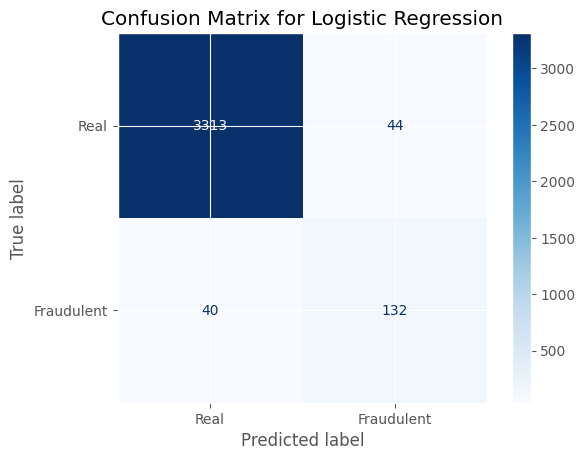

--------------------------------------------------
Model: Random Forest
Random Forest - F1 Score: 0.8840, ROC-AUC: 0.9864
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      3357
           1       0.99      0.64      0.78       172

    accuracy                           0.98      3529
   macro avg       0.99      0.82      0.88      3529
weighted avg       0.98      0.98      0.98      3529



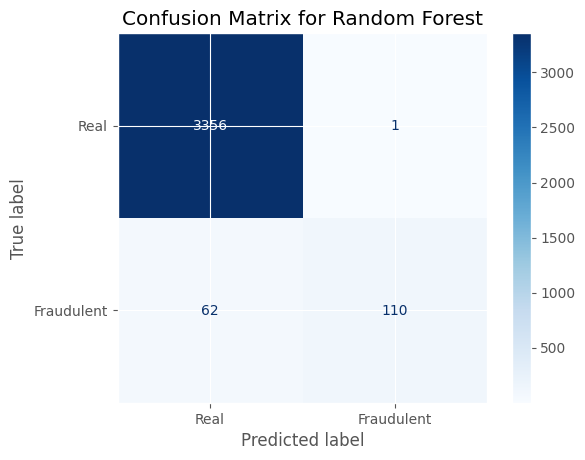

--------------------------------------------------
Model: SVC
SVC - F1 Score: 0.8976, ROC-AUC: 0.9725
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      3357
           1       0.94      0.70      0.80       172

    accuracy                           0.98      3529
   macro avg       0.96      0.85      0.90      3529
weighted avg       0.98      0.98      0.98      3529



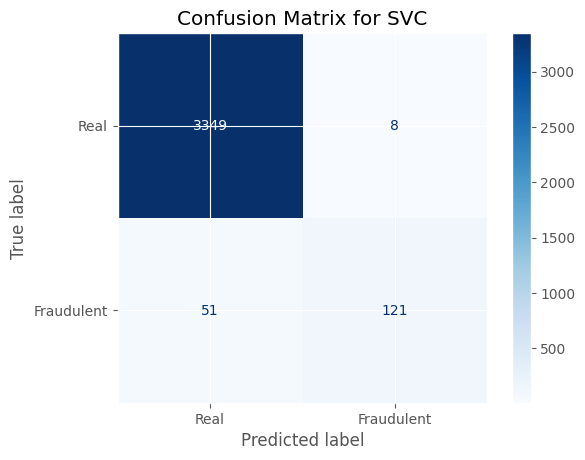

--------------------------------------------------
Model: Gradient Boosting
Gradient Boosting - F1 Score: 0.8586, ROC-AUC: 0.9722
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      3357
           1       0.86      0.63      0.73       172

    accuracy                           0.98      3529
   macro avg       0.92      0.81      0.86      3529
weighted avg       0.98      0.98      0.98      3529



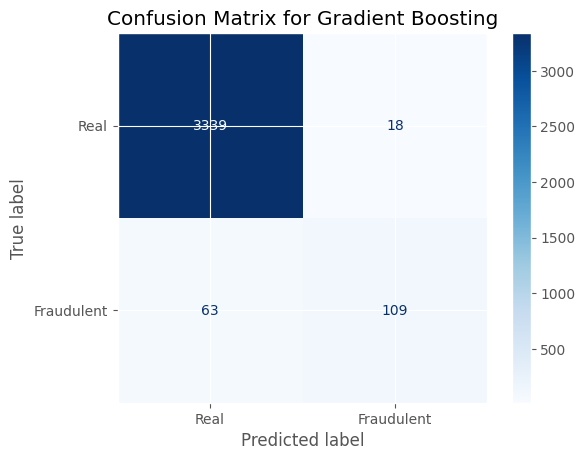

--------------------------------------------------
Model: XGBoost
XGBoost - F1 Score: 0.8927, ROC-AUC: 0.9874
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      3357
           1       0.89      0.72      0.79       172

    accuracy                           0.98      3529
   macro avg       0.94      0.86      0.89      3529
weighted avg       0.98      0.98      0.98      3529



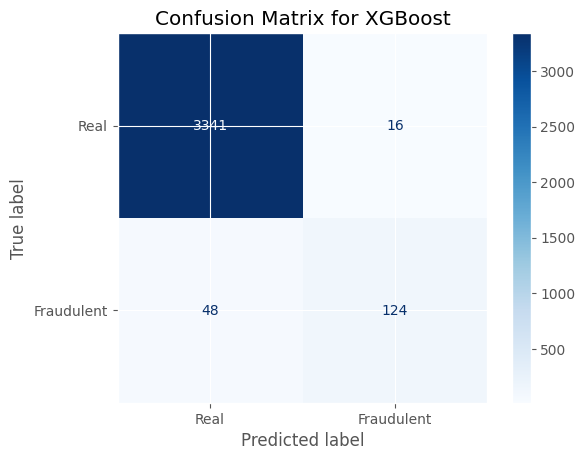

--------------------------------------------------
Model: LightGBM
LightGBM - F1 Score: 0.9023, ROC-AUC: 0.9895
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      3357
           1       0.93      0.72      0.81       172

    accuracy                           0.98      3529
   macro avg       0.96      0.86      0.90      3529
weighted avg       0.98      0.98      0.98      3529



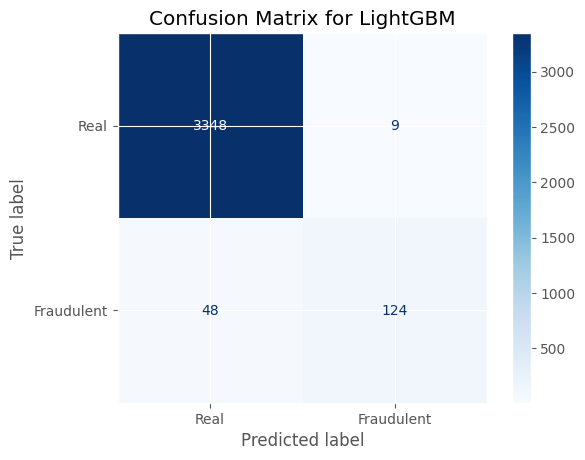

--------------------------------------------------


,Model,F1 Score,ROC-AUC
5,LightGBM,0.902337,0.989460
2,SVC,0.897628,0.972550
4,XGBoost,0.892692,0.987380
1,Random Forest,0.884043,0.986392
0,Logistic Regression,0.873051,0.974190
3,Gradient Boosting,0.858556,0.972209


In [41]:
modelling(models_no_weight, X_train_final, y_train, X_test_final, y_test)

Model: Logistic Regression
Logistic Regression - F1 Score: 0.8411, ROC-AUC: 0.9723
              precision    recall  f1-score   support

           0       0.99      0.97      0.98      3357
           1       0.60      0.84      0.70       172

    accuracy                           0.97      3529
   macro avg       0.80      0.90      0.84      3529
weighted avg       0.97      0.97      0.97      3529



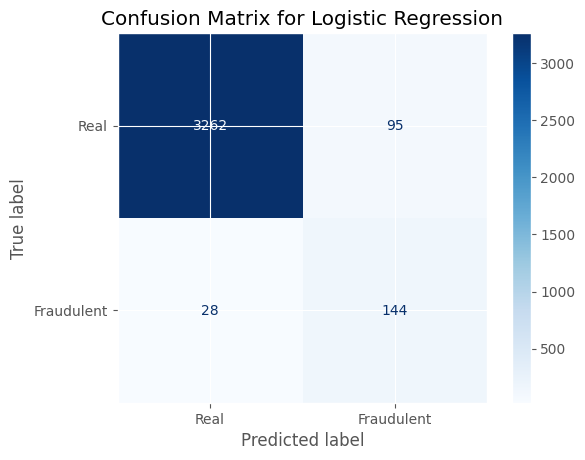

--------------------------------------------------
Model: Random Forest
Random Forest - F1 Score: 0.8713, ROC-AUC: 0.9855
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      3357
           1       0.98      0.61      0.75       172

    accuracy                           0.98      3529
   macro avg       0.98      0.80      0.87      3529
weighted avg       0.98      0.98      0.98      3529



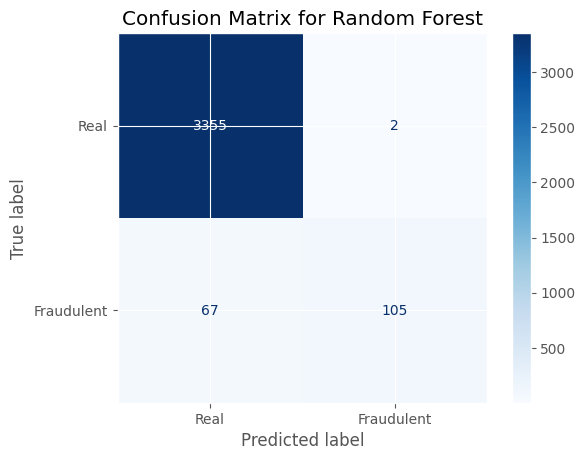

--------------------------------------------------
Model: SVC
SVC - F1 Score: 0.9149, ROC-AUC: 0.9872
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      3357
           1       0.83      0.84      0.84       172

    accuracy                           0.98      3529
   macro avg       0.91      0.92      0.91      3529
weighted avg       0.98      0.98      0.98      3529



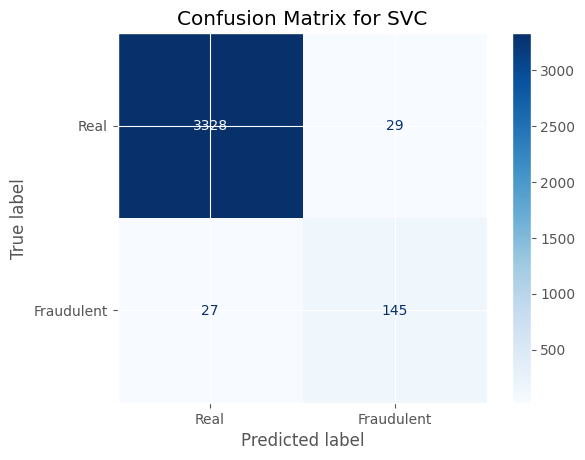

--------------------------------------------------
Model: XGBoost
XGBoost - F1 Score: 0.9173, ROC-AUC: 0.9859
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      3357
           1       0.90      0.79      0.84       172

    accuracy                           0.99      3529
   macro avg       0.95      0.89      0.92      3529
weighted avg       0.99      0.99      0.99      3529



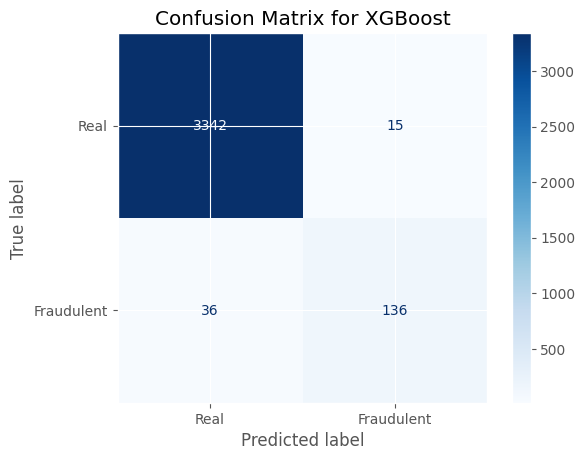

--------------------------------------------------
Model: LightGBM
LightGBM - F1 Score: 0.9105, ROC-AUC: 0.9900
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      3357
           1       0.87      0.79      0.83       172

    accuracy                           0.98      3529
   macro avg       0.93      0.89      0.91      3529
weighted avg       0.98      0.98      0.98      3529



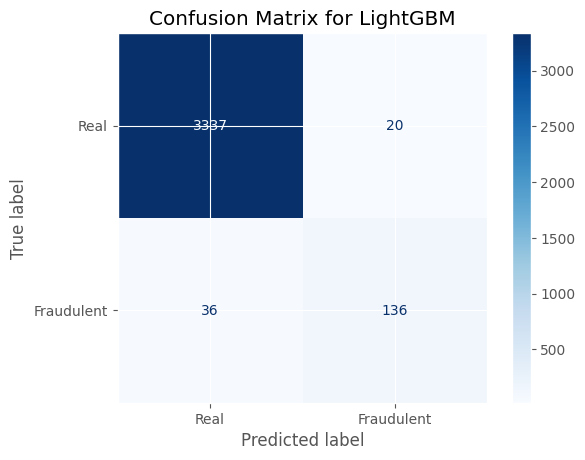

--------------------------------------------------


,Model,F1 Score,ROC-AUC
3,XGBoost,0.917266,0.985850
2,SVC,0.914904,0.987198
4,LightGBM,0.910474,0.990012
1,Random Forest,0.871255,0.985500
0,Logistic Regression,0.841113,0.972328


In [42]:
modelling(models_with_weight, X_train_final, y_train, X_test_final, y_test)

Voting Classifier - F1 Score: 0.9242, ROC-AUC: 0.9898
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      3357
           1       0.91      0.81      0.86       172

    accuracy                           0.99      3529
   macro avg       0.95      0.90      0.92      3529
weighted avg       0.99      0.99      0.99      3529



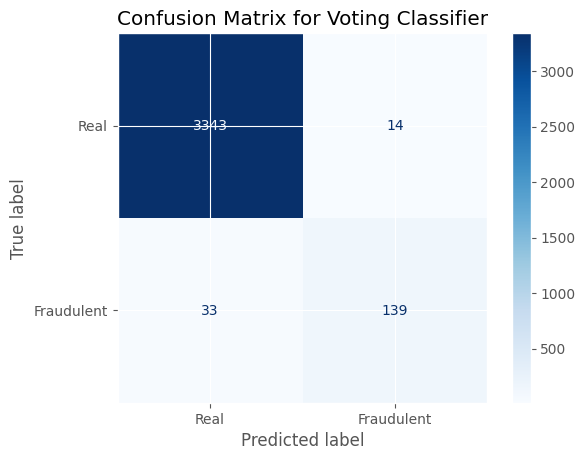

In [56]:
from sklearn.ensemble import VotingClassifier

estimators = [
    ('lgbm', LGBMClassifier(random_state=SEED, verbose=-1, class_weight=class_weights)),
    ('xgb', XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=SEED, scale_pos_weight = len(y_train[y_train==0]) / len(y_train[y_train==1]))),
    ('svc', SVC(probability=True, random_state=SEED, class_weight=class_weights))
]

voting_clf = VotingClassifier(estimators=estimators, voting='soft')
voting_clf.fit(X_train_final, y_train)
y_pred = voting_clf.predict(X_test_final)
y_proba = voting_clf.predict_proba(X_test_final)[:, 1]
f1 = f1_score(y_test, y_pred, average='macro')
roc_auc = roc_auc_score(y_test, y_proba)
print(f"Voting Classifier - F1 Score: {f1:.4f}, ROC-AUC: {roc_auc:.4f}")
print(classification_report(y_test, y_pred))
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Real", "Fraudulent"])
disp.plot(cmap='Blues')
plt.title(f'Confusion Matrix for Voting Classifier')
plt.show()

In [ ]:
with open("../artifacts/best_model.pkl", "wb") as f:
    pickle.dump(voting_clf, f)